First I've uploaded all the required basic libraries for data manipulation,numeric and static libraries like pandas,numpy,scipy and data visulaization tool like seaborn and matplotlib

In [1]:
import numpy as np
import pandas as pd
import scipy.stats
from scipy.stats import zscore,boxcox
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('Micro Credit Project.csv')
df

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,209589,1,22758I85348,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,...,6.0,0.0,2.0,12,6,0.0,1.000000,1.000000,UPW,2016-06-17
209589,209590,1,95583I84455,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,...,6.0,0.0,3.0,18,6,0.0,1.000000,1.000000,UPW,2016-06-12
209590,209591,1,28556I85350,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,...,12.0,0.0,6.0,54,12,0.0,4.000000,3.833333,UPW,2016-07-29
209591,209592,1,59712I82733,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,...,12.0,0.0,3.0,24,12,0.0,0.000000,10.500000,UPW,2016-07-25


##### Now,I've uploaded the CSV file of Micro Credit Defaulter Project and made a dataframe for the same. In this dataset I've to Build a model which can be used to predict in terms of a probability for each loan transaction, whether the customer will be paying back the loaned amount within 5 days of insurance of loan. In this case, Label ‘1’ indicates that the loan has been paid i.e. Non- defaulter, while, Label ‘0’ indicates that the loan has not been paid i.e. defaulter.Since the Target attribute 'label' is in the form of categorical format so will use classification model to bulild the same.

In [3]:
pd.set_option('display.max_columns',None)

### Exploratory Data Analysis(EDA)

In [4]:
print('Row"s are',df.shape[0])
print('Columns are',df.shape[1])
print('Shape is',df.shape)

Row"s are 209593
Columns are 37
Shape is (209593, 37)


In [5]:
#two dimensional dataframe
df.ndim

2

In [6]:
#Total datapoints in this dataframe
df.size

7754941

In [7]:
#indexes are-
df.index

RangeIndex(start=0, stop=209593, step=1)

In [8]:
#columns of the dataframes are-
df.columns

Index(['Unnamed: 0', 'label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90',
       'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')

In [9]:
df.dtypes

Unnamed: 0                int64
label                     int64
msisdn                   object
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_

In [10]:
#numeic dataframe
df_numeric= df.select_dtypes(include='number')
df_numeric

,Unnamed: 0,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90
0,1,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000
1,2,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000
2,3,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000
3,4,1,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000
4,5,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,209589,1,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,1.000000,1.000000
209589,209590,1,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,773,4,1.0,3092.0,773.0,161.30,6,2,4038,773.0,111.80,0.0,0.0,0,0,3,18,6.0,0.0,3.0,18,6,0.0,1.000000,1.000000
209590,209591,1,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,0.0,0.0,0,0,4,42,12.0,0.0,6.0,54,12,0.0,4.000000,3.833333
209591,209592,1,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,0.0,0.0,1,0,2,18,12.0,0.0,3.0,24,12,0.0,0.000000,10.500000


In [11]:
#categorical dataframe
df_categorical= df.select_dtypes(include='object')
df_categorical

,msisdn,pcircle,pdate
0,21408I70789,UPW,2016-07-20
1,76462I70374,UPW,2016-08-10
2,17943I70372,UPW,2016-08-19
3,55773I70781,UPW,2016-06-06
4,03813I82730,UPW,2016-06-22
...,...,...,...
209588,22758I85348,UPW,2016-06-17
209589,95583I84455,UPW,2016-06-12
209590,28556I85350,UPW,2016-07-29
209591,59712I82733,UPW,2016-07-25


In [12]:
from sklearn.compose import make_column_selector as selector

numerical_columns_selector = selector(dtype_exclude=object)
categorical_columns_selector = selector(dtype_include=object)

numerical_columns = numerical_columns_selector(df)
categorical_columns = categorical_columns_selector(df)

In [13]:
print(f'Categorical Columns are- {categorical_columns}\n\nThe number of Categorical Columns are = {len(categorical_columns)}')

Categorical Columns are- ['msisdn', 'pcircle', 'pdate']

The number of Categorical Columns are = 3


In [14]:
print(f'Numerical Columns are- {numerical_columns}\n\nThe number of Categorical Columns are = {len(numerical_columns)}')

Numerical Columns are- ['Unnamed: 0', 'label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30', 'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30', 'payback90']

The number of Categorical Columns are = 34


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

In [16]:
df.isnull().sum().sum()

0

Will drop the attribute 'Unnamed: 0' as index is already there and this attribute is not making any sense here,so will delete it going forward

In [17]:
df.drop('Unnamed: 0',axis=1,inplace=True)

In [18]:
df.shape

(209593, 36)

In [19]:
df.nunique()

label                        2
msisdn                  186243
aon                       4507
daily_decr30            147025
daily_decr90            158669
rental30                132148
rental90                141033
last_rech_date_ma         1186
last_rech_date_da         1174
last_rech_amt_ma            70
cnt_ma_rech30               71
fr_ma_rech30              1083
sumamnt_ma_rech30        15141
medianamnt_ma_rech30       510
medianmarechprebal30     30428
cnt_ma_rech90              110
fr_ma_rech90                89
sumamnt_ma_rech90        31771
medianamnt_ma_rech90       608
medianmarechprebal90     29785
cnt_da_rech30             1066
fr_da_rech30              1072
cnt_da_rech90               27
fr_da_rech90                46
cnt_loans30                 40
amnt_loans30                48
maxamnt_loans30           1050
medianamnt_loans30           6
cnt_loans90               1110
amnt_loans90                69
maxamnt_loans90              3
medianamnt_loans90           6
payback3

As we can see that the attribute 'pcircle' has only one unique category hence I'm going to drop it from the dataframe as it can create biasness in the model going forward.

In [20]:
df.drop('pcircle',axis=1,inplace=True)

In [21]:
df.shape

(209593, 35)

In [30]:
#I'm finding out value of all the attributes having less or equal to 60 categories
m=[]
for i in df.nunique():
    if i<=60:
        m.append(i)
m

[2, 27, 46, 40, 48, 6, 3, 6]

In [31]:
#Finding out the attributes having 60 or less categories
l=[]
for j in df.columns:
    if df[j].nunique()<=60:
        l.append(j)
l

['label',
 'cnt_da_rech90',
 'fr_da_rech90',
 'cnt_loans30',
 'amnt_loans30',
 'medianamnt_loans30',
 'maxamnt_loans90',
 'medianamnt_loans90']

## Data Visualization
### 1.Countplot

The Value Counts for the attribute "label" is
 1    183431
0     26162
Name: label, dtype: int64

The Countplot Diagram for the attribute "label" is
 AxesSubplot(0.125,0.125;0.775x0.755)


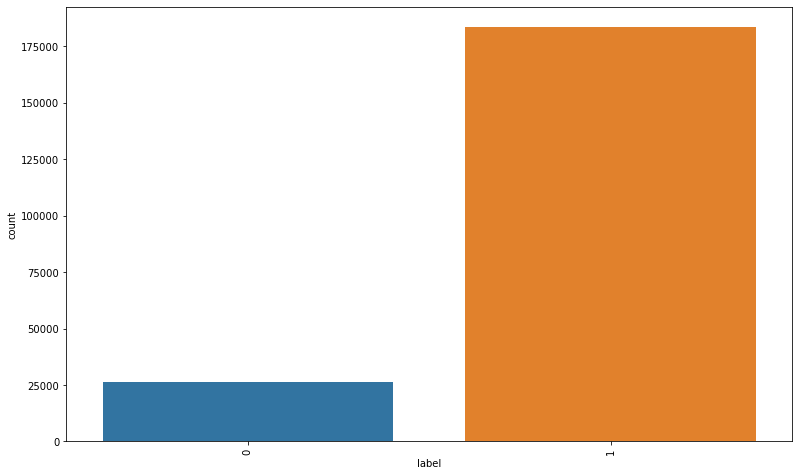



The Value Counts for the attribute "cnt_da_rech90" is
 0     204226
1       4173
2        556
3        227
4        150
5         74
6         49
7         36
8         30
9         18
14        10
12         7
11         7
13         6
10         6
16         4
18         3
15         2
20         1
25         1
28         1
30         1
22         1
38         1
19         1
27         1
17         1
Name: cnt_da_rech90, dtype: int64

The Countplot Diagram for the attribute "cnt_da_rech90" is
 AxesSubplot(0.125,0.125;0.775x0.755)


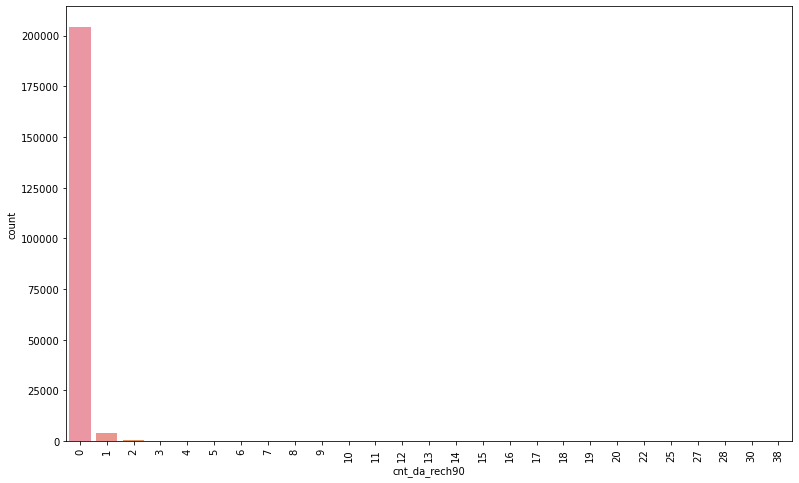



The Value Counts for the attribute "fr_da_rech90" is
 0     208728
3         78
1         66
2         66
4         56
7         55
6         52
5         45
8         44
10        33
14        32
9         32
11        30
12        27
19        22
28        19
15        17
13        17
18        16
29        15
16        14
17        14
25        11
22        11
21        10
20         9
32         8
24         8
27         8
26         7
30         7
31         6
34         5
37         5
23         5
57         3
35         2
41         2
42         1
39         1
33         1
43         1
56         1
46         1
55         1
64         1
Name: fr_da_rech90, dtype: int64

The Countplot Diagram for the attribute "fr_da_rech90" is
 AxesSubplot(0.125,0.125;0.775x0.755)


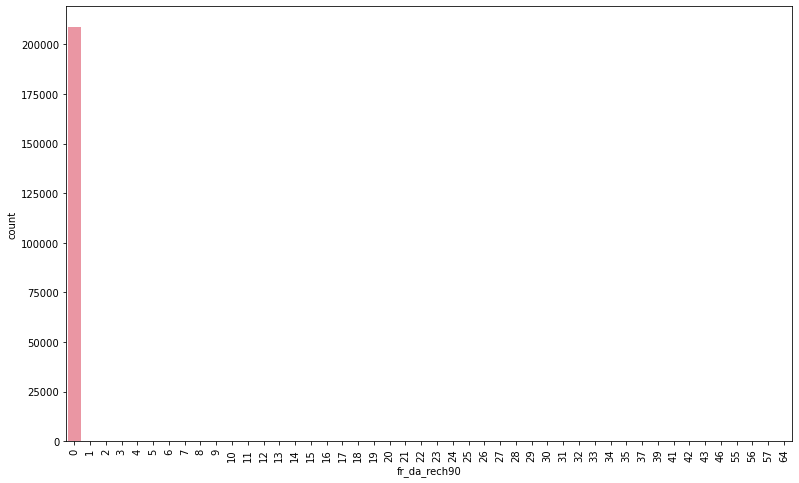



The Value Counts for the attribute "cnt_loans30" is
 1     83432
2     42665
3     27050
4     17499
5     11673
6      7773
7      5041
8      3384
0      3259
9      2273
10     1571
11     1143
12      793
13      547
14      383
15      270
16      213
17      164
18       98
19       77
20       54
21       45
22       42
23       38
25       19
26       17
27       15
24       13
29        9
31        8
28        7
30        4
32        4
33        3
38        2
36        1
41        1
44        1
50        1
35        1
Name: cnt_loans30, dtype: int64

The Countplot Diagram for the attribute "cnt_loans30" is
 AxesSubplot(0.125,0.125;0.775x0.755)


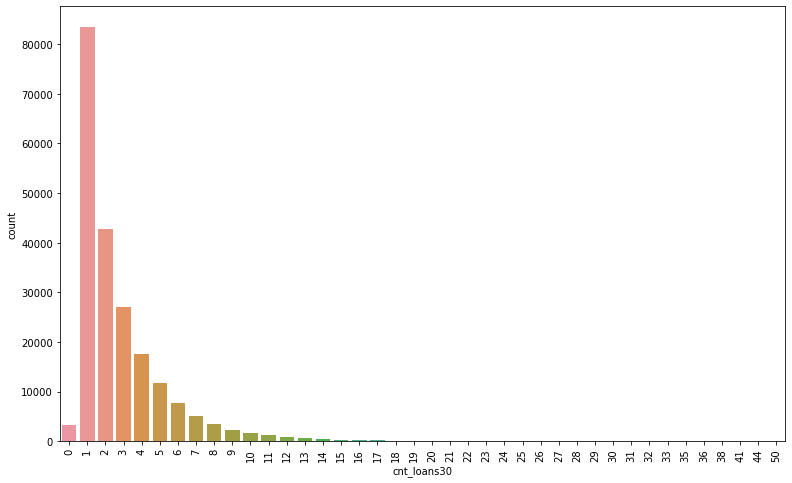



The Value Counts for the attribute "amnt_loans30" is
 6      76620
12     44384
18     26379
24     18403
30     11999
36      8559
42      5580
48      3994
0       3259
54      2660
60      2043
66      1402
72      1101
78       742
84       580
90       394
96       333
102      252
108      182
114      135
120      119
132       92
126       80
138       64
156       34
150       30
144       30
162       29
168       20
174       17
186       15
180       13
192        7
198        6
252        4
210        4
228        4
216        4
222        3
258        3
264        3
276        3
240        2
204        2
246        1
300        1
270        1
306        1
Name: amnt_loans30, dtype: int64

The Countplot Diagram for the attribute "amnt_loans30" is
 AxesSubplot(0.125,0.125;0.775x0.755)


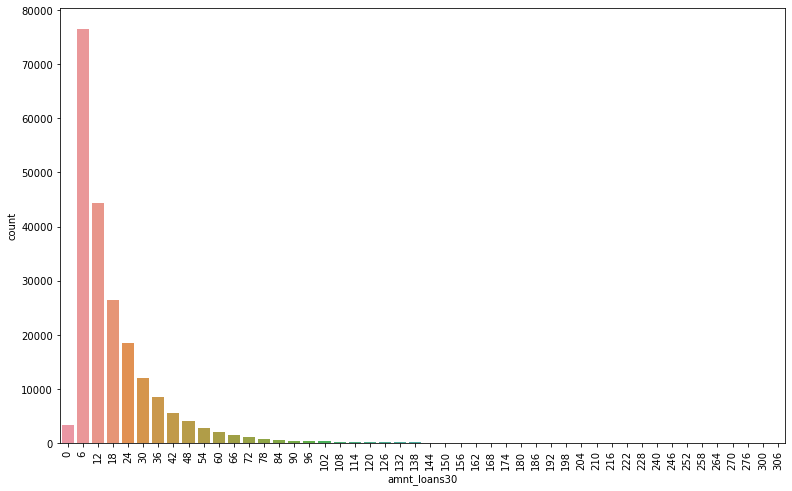



The Value Counts for the attribute "medianamnt_loans30" is
 0.0    195445
1.0      7149
0.5      6538
2.0       420
1.5        38
3.0         3
Name: medianamnt_loans30, dtype: int64

The Countplot Diagram for the attribute "medianamnt_loans30" is
 AxesSubplot(0.125,0.125;0.775x0.755)


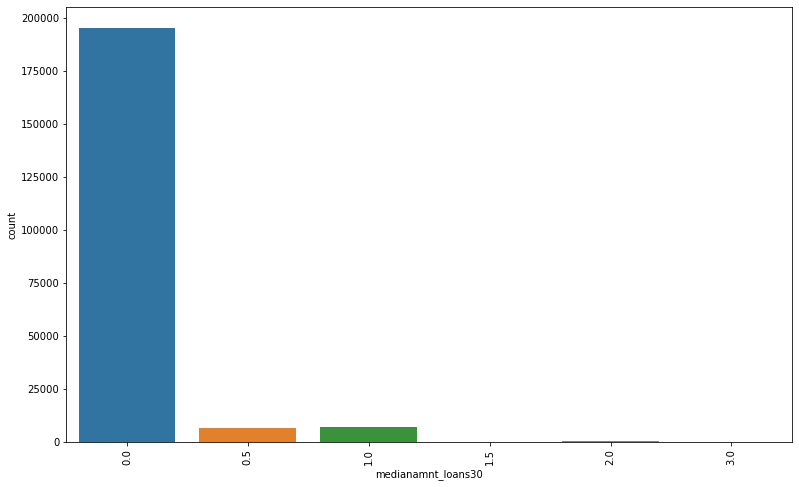



The Value Counts for the attribute "maxamnt_loans90" is
 6     180945
12     26605
0       2043
Name: maxamnt_loans90, dtype: int64

The Countplot Diagram for the attribute "maxamnt_loans90" is
 AxesSubplot(0.125,0.125;0.775x0.755)


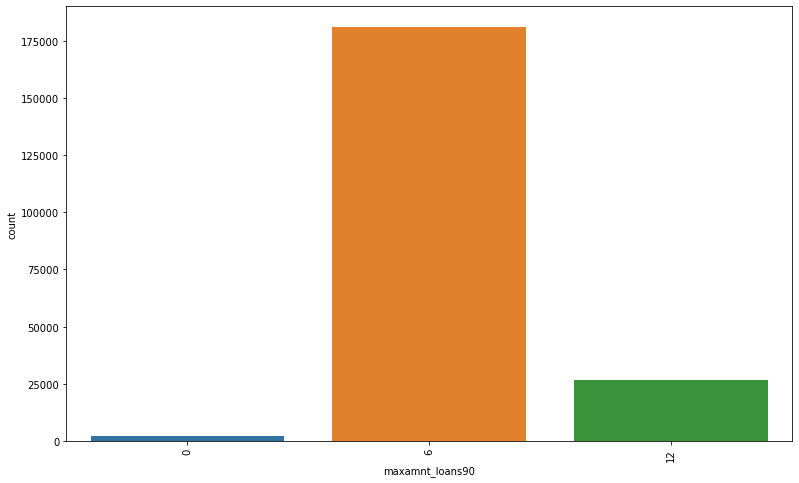



The Value Counts for the attribute "medianamnt_loans90" is
 0.0    197424
1.0      6172
0.5      5668
2.0       307
1.5        19
3.0         3
Name: medianamnt_loans90, dtype: int64

The Countplot Diagram for the attribute "medianamnt_loans90" is
 AxesSubplot(0.125,0.125;0.775x0.755)


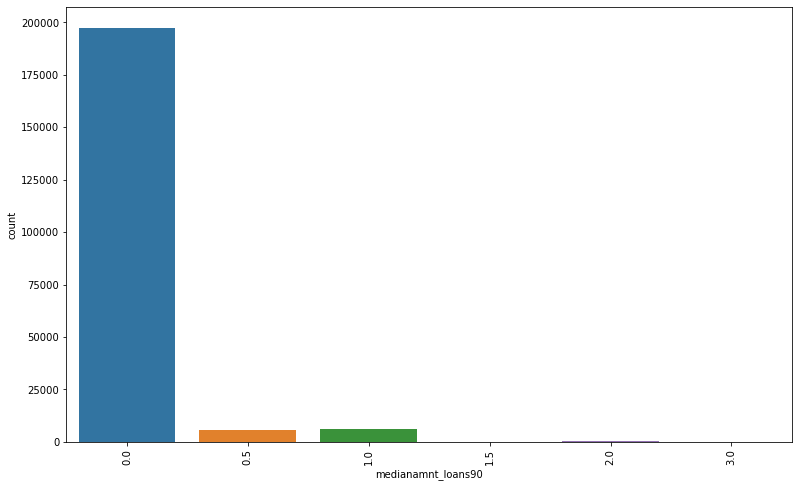

In [32]:
#plotting the graphs for those attributes having less categories only
for i in l:
    print(f'The Value Counts for the attribute "{i}" is\n {df[i].value_counts()}')
    plt.figure(figsize=(13,8))
    print(f'\nThe Countplot Diagram for the attribute "{i}" is\n {sns.countplot(df[i])}')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

This plot basically do the counting of each unique values.

1.As we can see that 87% of the customers have been payed their loan with in 5 days of insurance of loan i.e. are Non- defaulters, while, 12% of the customers have not paid their loans back within 5 days of insurance of loan i.e. are defaulters.

2.40% of the customers have taken only one loan in last 30 days.

3.37% of the customers have taken Total amount of loans as 6 Rupiah in last 30 days.

4.Median of amounts of loan taken by 93% of the customers in last 30 days is Zero and it means almost each entry of this columns is zero ergo will drop this column otherwise it will create biasness in the model.

5.Maximum amount of loan taken by the 87% of the customers in last 90 days is 6 Rupiah and the same of 13% of the customers is 12 Rupiah.

6.Median of amounts of loan taken by 94% of the customers in last 90 days is Zero Rupiah and it means almost each entry of this columns is zero ergo will drop this column otherwise it will create biasness too in the model.

7.As we can see in the above countplot graph that the attribute 'fr_da_rech90' which represents the Frequency of data account recharged in last 90 days; indicates that there is zero recharge happened in last 90 days for almost 99.58% of the times and three recharges happened for 0.03% of the times. Hence since the occurance of zero for this attributes is almost 100% hence will drop this column.Also the the attribute 'cnt_da_rech90' which represent Number of times data account got recharged in last 90 days; indicates that there is zero recharge happened in last 90 days for 97% of the times and one recharges happened for 2% of the times. Hence since the occurance of zero for this attributes is very high as compare to other classes hence will drop this column too.


### 2.Histogram


The Histplot Diagram for the attribute "label" is
 AxesSubplot(0.125,0.125;0.775x0.755)


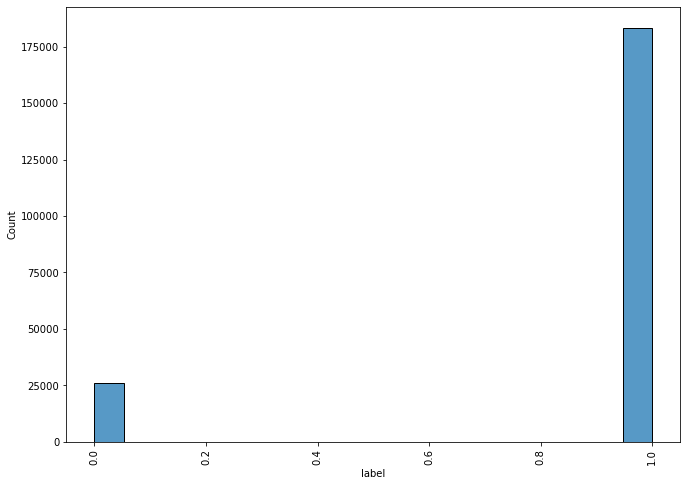




The Histplot Diagram for the attribute "cnt_da_rech90" is
 AxesSubplot(0.125,0.125;0.775x0.755)


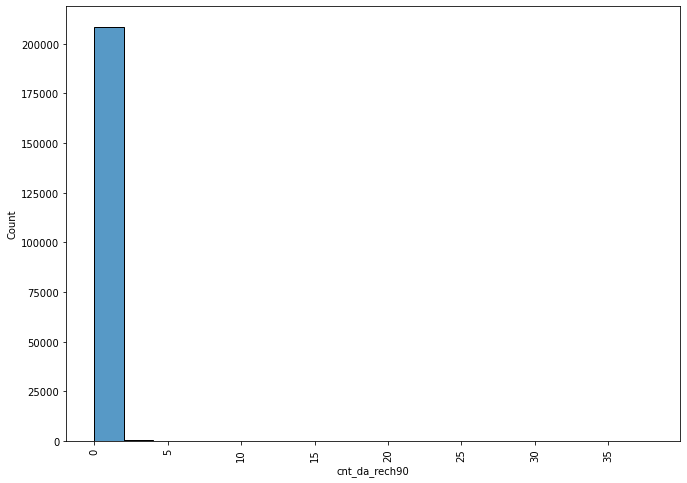




The Histplot Diagram for the attribute "fr_da_rech90" is
 AxesSubplot(0.125,0.125;0.775x0.755)


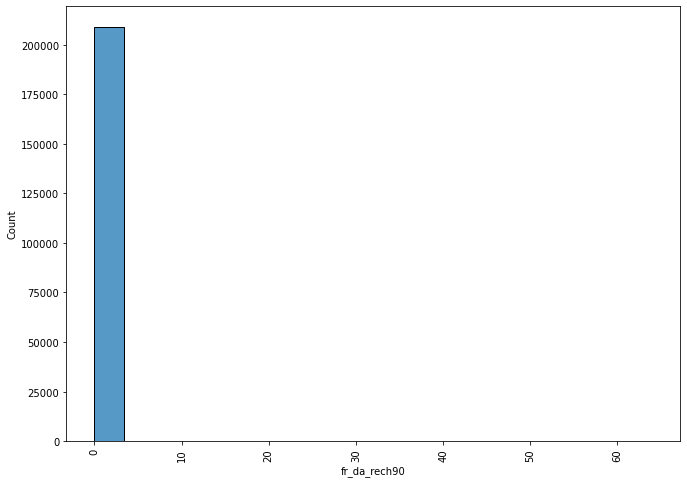




The Histplot Diagram for the attribute "cnt_loans30" is
 AxesSubplot(0.125,0.125;0.775x0.755)


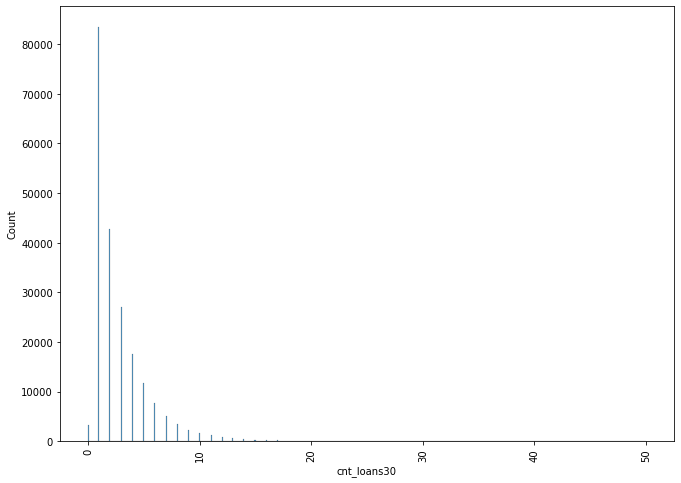




The Histplot Diagram for the attribute "amnt_loans30" is
 AxesSubplot(0.125,0.125;0.775x0.755)


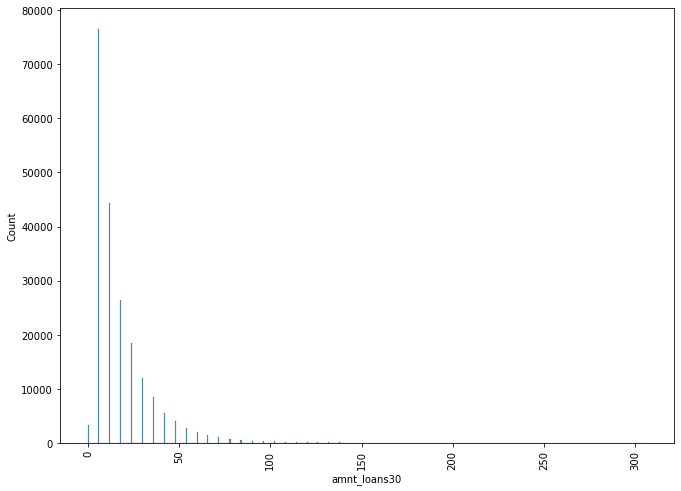




The Histplot Diagram for the attribute "medianamnt_loans30" is
 AxesSubplot(0.125,0.125;0.775x0.755)


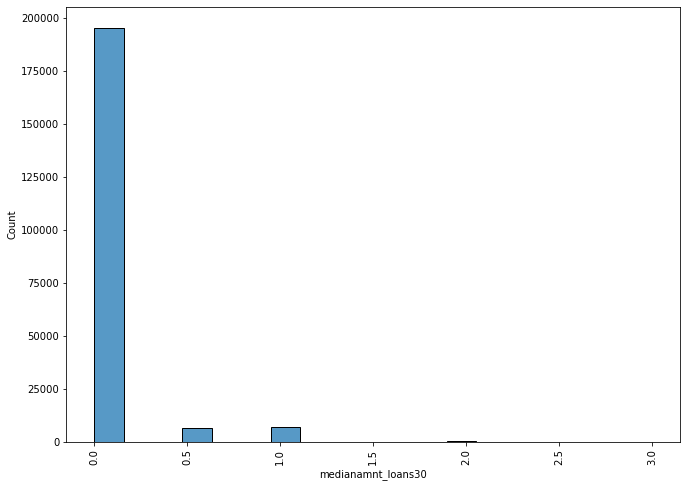




The Histplot Diagram for the attribute "maxamnt_loans90" is
 AxesSubplot(0.125,0.125;0.775x0.755)


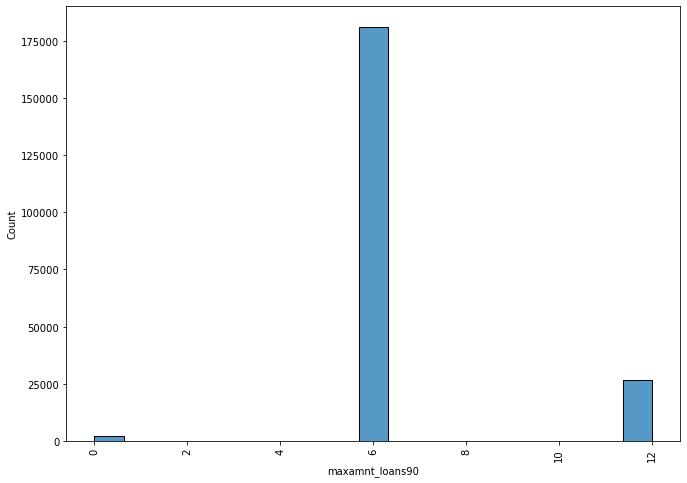




The Histplot Diagram for the attribute "medianamnt_loans90" is
 AxesSubplot(0.125,0.125;0.775x0.755)


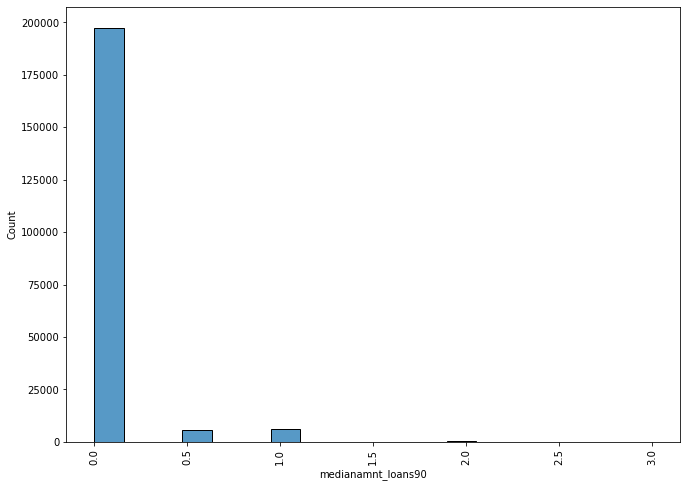

In [34]:
for i in l:
    plt.figure(figsize=(11,8))
    print(f'\nThe Histplot Diagram for the attribute "{i}" is\n {sns.histplot(df[i])}')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

### 3.Scatterplot

The Scatter Plot for the attribute "label" & "label" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


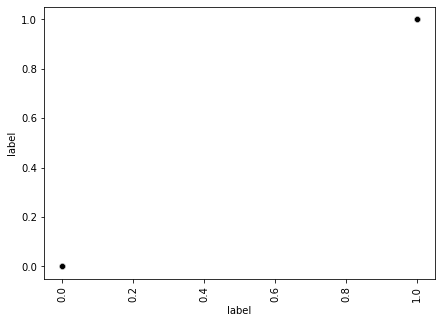



The Scatter Plot for the attribute "label" & "cnt_da_rech90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


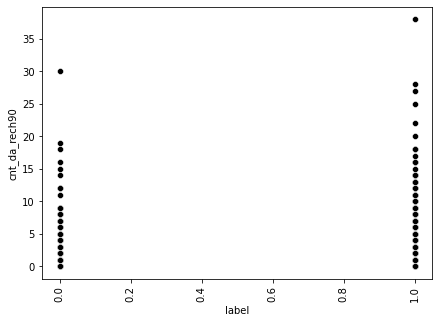



The Scatter Plot for the attribute "label" & "fr_da_rech90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


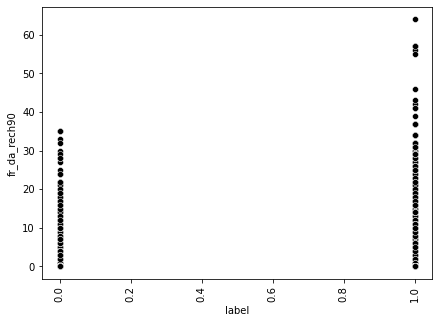



The Scatter Plot for the attribute "label" & "cnt_loans30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


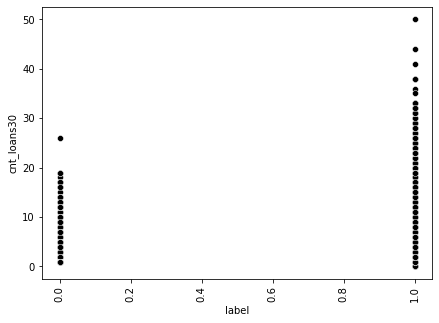



The Scatter Plot for the attribute "label" & "amnt_loans30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


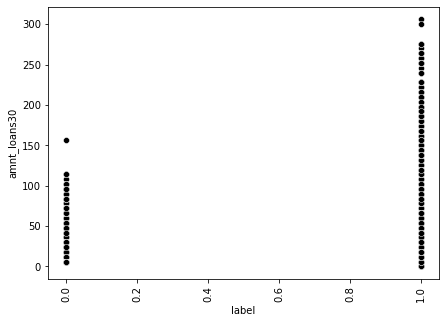



The Scatter Plot for the attribute "label" & "medianamnt_loans30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


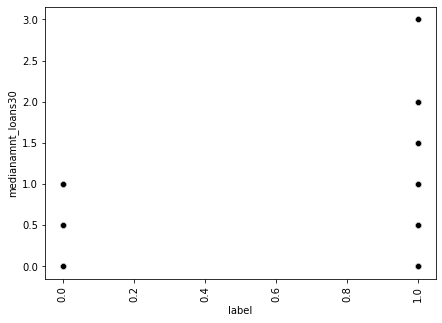



The Scatter Plot for the attribute "label" & "maxamnt_loans90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


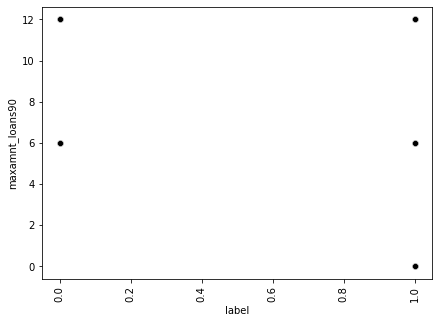



The Scatter Plot for the attribute "label" & "medianamnt_loans90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


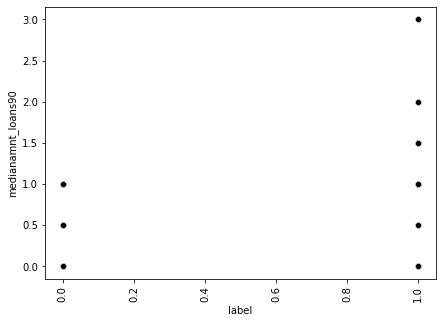

In [36]:
for i in l:
    plt.figure(figsize=(7,5))
    print(f'The Scatter Plot for the attribute "label" & "{i}" is-\n {sns.scatterplot(df.label,df[i],color="black")}')
    plt.xticks(rotation=90)
    plt.show()
    print('\n')

These graph are showing that outliers are present almost in all the attributes of the dataset.

### 4.Categorical Plotting

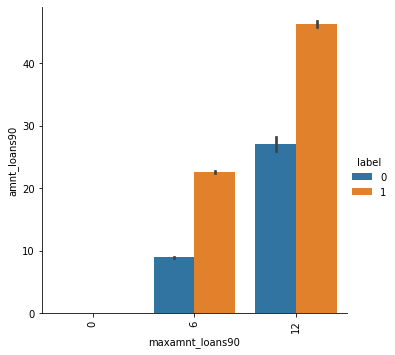

In [38]:
sns.catplot(x='maxamnt_loans90',y='amnt_loans90',hue='label',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

Maximum amount of loan taken by the customers in last 90 days are 0, 6 or 12 Rupiah.
Total amount of loans taken by customers having maximum amount loan 12 Rupiah has higher total amount loan than that of the customers having maximum amount loan of 6 Rupiah in last 90 days.

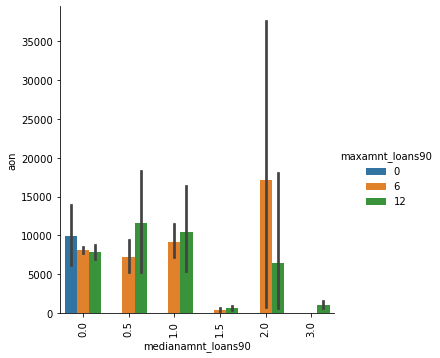

In [39]:
sns.catplot(x='medianamnt_loans90',y='aon',hue='maxamnt_loans90',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

Those Customer using mobile devices since more than 15000 days have taken maximum amount of loan in last 90 days as 6 Rupiah and the Median of amounts of loan taken by the them in the last 90 days is 2 Rupiah  

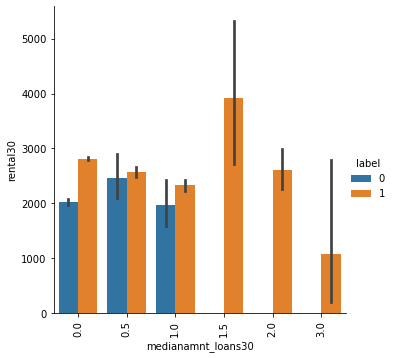

In [40]:
sns.catplot(x='medianamnt_loans30',y='rental30',hue='label',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

Customers those have Median of amounts of loan as 1.5 or more than 1.5 Rupiah are not defaulters i.e. they use to pay back their loans on time when their Average main account balance over last 30 days is approx 4000 Rupiah,if the Median of amounts of loan as 1.5 

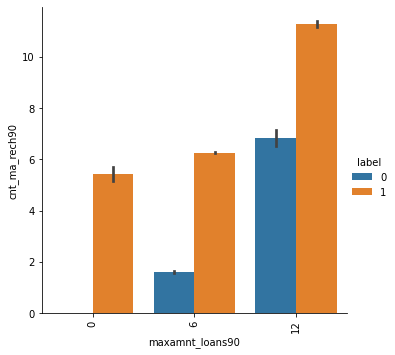

In [41]:
sns.catplot(x='maxamnt_loans90',y='cnt_ma_rech90',hue='label',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

In-case customer is taking up maximum amount of loan as 12 Rupiah the probability of returning the loan back within 5 days is 100% when Number of times main account got recharged in last 90 days is more than 10 times.

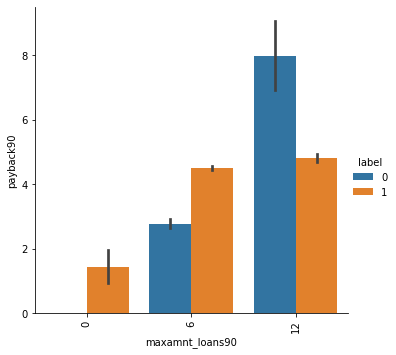

In [87]:
sns.catplot(x='maxamnt_loans90',y='payback90',hue='label',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

In-case customer is taking up maximum amount of loan as 12 Rupiah then there Average payback time is 8 days over last 90 days

###### I'm converting the attribute 'pdate' in month and week format,so that i can plot some more rlationship among the variables.

In [43]:
#datetime format
df.pdate=pd.to_datetime(df.pdate)
df.pdate.dtypes

dtype('<M8[ns]')

In [44]:
df['Month']=df.pdate.dt.month_name()
df['Week']=df.pdate.dt.week

In [46]:
#Now dropping the 'pdate' column as it's not necessary to keep it further
df.drop('pdate',axis=1,inplace=True)

In [47]:
#checking the shape again
df.shape

(209593, 36)

In [51]:
#checking the data-types and null values again
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 36 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   msisdn                209593 non-null  object 
 2   aon                   209593 non-null  float64
 3   daily_decr30          209593 non-null  float64
 4   daily_decr90          209593 non-null  float64
 5   rental30              209593 non-null  float64
 6   rental90              209593 non-null  float64
 7   last_rech_date_ma     209593 non-null  float64
 8   last_rech_date_da     209593 non-null  float64
 9   last_rech_amt_ma      209593 non-null  int64  
 10  cnt_ma_rech30         209593 non-null  int64  
 11  fr_ma_rech30          209593 non-null  float64
 12  sumamnt_ma_rech30     209593 non-null  float64
 13  medianamnt_ma_rech30  209593 non-null  float64
 14  medianmarechprebal30  209593 non-null  float64
 15  

In [89]:
#checking the uniqueness
print(df['Month'].value_counts())
print(df.Month.nunique())

July      85765
June      83154
August    40674
Name: Month, dtype: int64
3


<AxesSubplot:xlabel='Month', ylabel='count'>

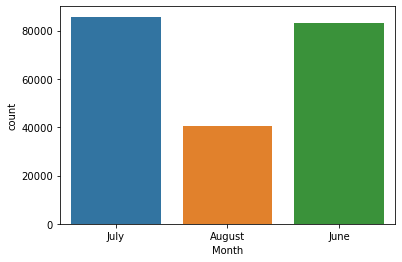

In [90]:
#plotting the count
sns.countplot(df['Month'])

As we can see that out of three months July and June are leading w.r.t. transactions

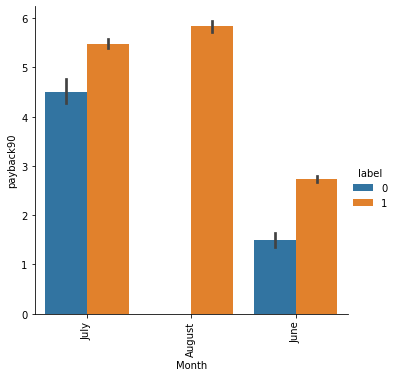

In [52]:
sns.catplot(x='Month',y='payback90',hue='label',data=df,kind='bar')
plt.xticks(rotation=90)
plt.show()

In the month August there are no defaulters and there Average payback time in days is almost 6 over last 90 days, whereas in the month of June and July there are Defaulters present with the Average payback time for July in days is almost 5 and for June is approx 2 days over last 90 days.

###### As we can see in the above countplot graph that the attribute 'fr_da_rech90' which represents the Frequency of data account recharged in last 90 days; indicates that there is zero recharge happened in last 90 days for 208728 times and 3 recharges happened for 78 times. Hence since the occurance of zero for this attributes is high hence will drop this column.Also the the attribute 'cnt_da_rech90' which represent Number of times data account got recharged in last 90 days; indicates that there is zero recharge happened in last 90 days for 204226 times and 1 recharges happened for 4173 times. Hence since the occurance of zero for this attributes is very high as compare to other classes hence will drop this column too.

In [61]:
df.drop('fr_da_rech90',axis=1,inplace=True)

In [64]:
df.drop('cnt_da_rech90',axis=1,inplace=True)

In [71]:
df.drop('medianamnt_loans30',axis=1,inplace=True)

In [78]:
df.drop('medianamnt_loans90',axis=1,inplace=True)

### Encoding
##### Now I'll convert all the categorical columns into numeric one by applying label encoder technique
### Label Encoder

In [91]:
import sklearn
from sklearn.preprocessing import LabelEncoder

In [92]:
for j in ['Month','msisdn']:
    df[j]=LabelEncoder().fit_transform(df[j].astype(str))

In [93]:
df.head()

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Month,Week
0,0,40191,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,2,12,6.0,2.0,12,6,29.000000,29.000000,1,29
1,1,142291,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,1,12,12.0,1.0,12,12,0.000000,0.000000,0,32
2,1,33594,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,1,6,6.0,1.0,6,6,0.000000,0.000000,0,33
3,1,104157,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,2,12,6.0,2.0,12,6,0.000000,0.000000,2,23
4,1,6910,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,7,42,6.0,7.0,42,6,2.333333,2.333333,2,25


Since the client has given some of the conditions as- the attribute 'maxamnt_loans30' which represent;maximum amount of loan taken by the customer in last 30 days and There are only two options; 5 & 10 Rs., for which the customer needs to pay back 6 & 12 Rs. respectively

In [102]:
#checking the values = 6
df[df.maxamnt_loans30==6]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Month,Week
0,0,40191,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,2,12,6.0,2.0,12,6,29.000000,29.000000,1,29
2,1,33594,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,1,6,6.0,1.0,6,6,0.000000,0.000000,0,33
3,1,104157,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,2,12,6.0,2.0,12,6,0.000000,0.000000,2,23
4,1,6910,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,7,42,6.0,7.0,42,6,2.333333,2.333333,2,25
5,1,67908,568.0,2257.362667,2261.460000,368.13,380.13,2.0,0.0,1539,4,10.0,6156.0,1539.0,15.40,8,0,11744,1539.0,55.90,0.0,0.0,3,18,6.0,3.0,18,6,11.000000,8.333333,1,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209583,1,57153,935.0,15.550667,15.550667,140.44,140.44,4.0,0.0,1547,3,2.0,4641.0,1547.0,41.00,5,2,8508,1547.0,41.00,0.0,0.0,1,6,6.0,1.0,6,6,0.000000,0.000000,2,22
209584,0,131104,945.0,0.000000,0.000000,78.30,78.30,0.0,0.0,0,0,0.0,0.0,0.0,0.00,0,0,0,0.0,0.00,0.0,0.0,1,6,6.0,1.0,6,6,0.000000,0.000000,2,23
209585,1,22850,793.0,5350.315333,5356.210000,594.80,640.20,2.0,0.0,2309,4,16.0,7696.0,1924.0,34.00,4,16,7696,1924.0,34.00,0.0,0.0,5,30,6.0,5.0,30,6,5.200000,5.200000,1,27
209588,1,42866,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,0.0,0.0,2,12,6.0,2.0,12,6,1.000000,1.000000,2,24


In [103]:
#checking the values =12
df[df.maxamnt_loans30==12]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Month,Week
1,1,142291,712.0,12122.000000,12124.75,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,1,12,12.0,1.0,12,12,0.0,0.000000,0,32
36,1,78125,1578.0,38740.076000,38935.57,4662.68,5416.68,1.0,0.0,4048,10,2.0,29475.0,2309.0,45.24,20,4,50839,2309.0,62.74,0.0,0.0,6,54,12.0,15.0,108,12,2.0,1.875000,1,30
37,1,2031,725.0,9740.000000,16337.04,299.96,1457.22,15.0,63.0,5787,1,0.0,5787.0,5787.0,146.50,6,8,21009,4048.0,131.00,0.0,0.0,3,24,12.0,4.0,30,12,7.5,19.750000,0,32
44,1,154434,277.0,15617.000000,17973.55,3638.78,7819.71,6.0,0.0,2309,3,5.0,7796.0,2309.0,29.00,6,2,12413,1924.0,56.00,0.0,0.0,2,18,12.0,4.0,30,12,0.0,7.000000,0,32
48,1,6805,406.0,8160.000000,9604.75,599.66,689.66,19.0,0.0,4048,2,1.0,8096.0,4048.0,48.00,3,50,12144,4048.0,64.00,0.0,0.0,1,12,12.0,1.0,12,12,0.0,0.000000,0,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209586,1,112557,254.0,20079.157333,20228.09,4003.12,5173.74,2.0,0.0,1539,9,4.0,17243.0,1547.0,37.00,17,2,33719,1547.0,37.00,0.0,0.0,6,66,12.0,15.0,120,12,3.0,2.400000,1,29
209587,1,37325,239.0,14678.000000,14704.90,12935.26,16775.60,8.0,0.0,3178,3,3.0,12143.0,3178.0,914.00,5,17,14455,3178.0,28.00,0.0,0.0,1,12,12.0,3.0,24,12,0.0,30.000000,0,31
209590,1,53995,1013.0,11843.111667,11904.35,5861.83,8893.20,3.0,0.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,0.0,0.0,4,42,12.0,6.0,54,12,4.0,3.833333,1,30
209591,1,111388,1732.0,12488.228333,12574.37,411.83,984.58,2.0,38.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,0.0,0.0,2,18,12.0,3.0,24,12,0.0,10.500000,1,30


As, we can see that maximum amount of loan taken by the customer in last 30 days is either 6 Rupiah as 86% or 12 Rupiah as 12.5% and suming all together it comes as 99% approx hence will drop these 1% outliers in the data cleansing process later on.

In [109]:
#This is the dataset of the Non-defaulter
df[df.label==1]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Month,Week
1,1,142291,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,1,12,12.0,1.0,12,12,0.000000,0.000000,0,32
2,1,33594,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,1,6,6.0,1.0,6,6,0.000000,0.000000,0,33
3,1,104157,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,2,12,6.0,2.0,12,6,0.000000,0.000000,2,23
4,1,6910,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,7,42,6.0,7.0,42,6,2.333333,2.333333,2,25
5,1,67908,568.0,2257.362667,2261.460000,368.13,380.13,2.0,0.0,1539,4,10.0,6156.0,1539.0,15.40,8,0,11744,1539.0,55.90,0.0,0.0,3,18,6.0,3.0,18,6,11.000000,8.333333,1,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,1,42866,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,0.0,0.0,2,12,6.0,2.0,12,6,1.000000,1.000000,2,24
209589,1,178248,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,773,4,1.0,3092.0,773.0,161.30,6,2,4038,773.0,111.80,0.0,0.0,3,18,6.0,3.0,18,6,1.000000,1.000000,2,23
209590,1,53995,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,0.0,0.0,4,42,12.0,6.0,54,12,4.000000,3.833333,1,30
209591,1,111388,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,0.0,0.0,2,18,12.0,3.0,24,12,0.000000,10.500000,1,30


In [107]:
#This is the dataset of the defaulter
df[df.label==0]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Month,Week
0,0,40191,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,2,12,6.0,2.0,12,6,29.0,29.0,1,29
11,0,153533,82.0,65.166667,65.166667,326.20,326.20,17.0,0.0,7526,2,0.0,9065.0,4532.5,489.00,2,0,9065,4532.5,489.00,0.0,0.0,1,6,6.0,1.0,6,6,0.0,0.0,2,25
15,0,45360,1037.0,12.000000,12.000000,1216.80,1216.80,0.0,0.0,0,0,0.0,0.0,0.0,0.00,0,0,0,0.0,0.00,0.0,0.0,1,6,6.0,1.0,6,6,0.0,0.0,2,25
16,0,152887,1583.0,1000.000000,1000.000000,1000.80,1087.88,0.0,0.0,0,0,0.0,0.0,0.0,0.00,0,0,0,0.0,0.00,0.0,0.0,1,6,6.0,1.0,6,6,0.0,0.0,1,27
21,0,140529,378.0,514.693333,515.200000,56.26,58.20,2.0,0.0,773,1,0.0,773.0,773.0,542.00,2,64,1546,773.0,283.50,0.0,0.0,2,12,6.0,2.0,12,6,0.0,0.0,1,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209547,0,60960,153.0,5670.733333,5672.200000,1817.08,2764.88,0.0,0.0,0,0,0.0,0.0,0.0,0.00,0,0,0,0.0,0.00,0.0,0.0,1,6,6.0,1.0,6,6,0.0,0.0,1,29
209549,0,111070,843.0,729.235000,758.470000,7470.90,9537.90,1.0,0.0,770,1,0.0,770.0,770.0,19.82,2,40,6557,3278.5,49.82,0.0,0.0,1,6,6.0,2.0,12,6,0.0,25.5,1,28
209554,0,93112,744.0,1454.491667,1461.750000,559.73,655.28,31.0,0.0,2309,0,0.0,0.0,0.0,0.00,1,0,2309,2309.0,20.00,0.0,0.0,1,6,6.0,1.0,6,6,0.0,0.0,1,28
209571,0,111501,827.0,1867.668667,1881.180000,1875.72,2312.65,14.0,0.0,1924,2,3.0,3848.0,1924.0,6.20,2,3,3848,1924.0,6.20,0.0,0.0,1,6,6.0,1.0,6,6,0.0,0.0,1,28


In [111]:
print(df[df.label==1]['daily_decr30'].mean())
print(df[df.label==1]['daily_decr90'].mean())

5967.45549689163
6767.6464228785235


In [112]:
print(df[df.label==0]['daily_decr30'].mean())
print(df[df.label==0]['daily_decr90'].mean())

1272.3767559819582
1278.8177356343783


As, we can see that the mean of Daily amount spent from main account, averaged over last 30 and 90 days (in Indonesian Rupiah) for non-defaulter datasets are greater than same of defaulter dataset. So that can be one of the reason in being defaulters as their spendings are less.

In [116]:
#August_dataset
df[df.Month==0]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Month,Week
1,1,142291,712.0,12122.00,12124.75,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,1,12,12.0,1.0,12,12,0.000000,0.000000,0,32
2,1,33594,535.0,1398.00,1398.00,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,1,6,6.0,1.0,6,6,0.000000,0.000000,0,33
7,1,18377,768.0,12905.00,17804.15,900.35,2549.11,4.0,55.0,3178,3,3.0,10404.0,3178.0,36.00,9,3,26095,3178.0,36.00,0.0,0.0,3,18,6.0,7.0,42,6,6.000000,3.857143,0,31
14,1,117752,707.0,8919.00,10317.35,399.25,2453.78,3.0,0.0,770,3,6.0,3079.0,770.0,66.00,8,10,19185,1539.0,52.50,0.0,0.0,3,18,6.0,7.0,42,6,5.000000,4.166667,0,31
22,1,114871,463.0,1540.00,1541.00,969.12,969.12,4.0,0.0,770,1,0.0,770.0,770.0,43.00,2,66,1543,771.5,26.50,0.0,0.0,1,6,6.0,2.0,12,6,0.000000,42.000000,0,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209578,1,155073,1256.0,30900.83,45485.28,8438.77,14562.40,5.0,0.0,1539,5,8.0,6926.0,1539.0,11.80,25,2,27715,773.0,53.63,0.0,0.0,5,42,12.0,6.0,48,12,3.250000,3.800000,0,33
209579,1,94917,155.0,11400.00,16265.00,3611.23,7196.49,3.0,0.0,1539,5,6.0,7695.0,1539.0,59.00,11,8,13856,1539.0,60.00,0.0,0.0,4,24,6.0,7.0,42,6,6.000000,6.142857,0,32
209580,1,25927,1365.0,18657.00,24825.00,6314.34,12318.22,26.0,0.0,11874,1,0.0,11874.0,11874.0,29.00,3,28,25922,10000.0,31.00,0.0,0.0,0,0,0.0,0.0,0,0,0.000000,0.000000,0,31
209581,1,74535,377.0,28785.00,45515.00,3956.57,14753.13,2.0,0.0,1539,4,2.0,12913.0,1924.0,22.00,18,2,52487,1539.0,62.50,0.0,0.0,4,36,12.0,10.0,72,12,2.666667,2.777778,0,33


In [117]:
#july_dataset
df[df.Month==1]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Month,Week
0,0,40191,272.0,3055.050000,3065.15,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,2,12,6.0,2.0,12,6,29.0,29.000000,1,29
5,1,67908,568.0,2257.362667,2261.46,368.13,380.13,2.0,0.0,1539,4,10.0,6156.0,1539.0,15.40,8,0,11744,1539.0,55.90,0.0,0.0,3,18,6.0,3.0,18,6,11.0,8.333333,1,26
6,1,180459,545.0,2876.641667,2883.97,335.75,402.90,13.0,0.0,5787,1,0.0,5787.0,5787.0,277.80,1,0,5787,5787.0,277.80,0.0,0.0,1,6,6.0,1.0,6,6,0.0,0.000000,1,27
16,0,152887,1583.0,1000.000000,1000.00,1000.80,1087.88,0.0,0.0,0,0,0.0,0.0,0.0,0.00,0,0,0,0.0,0.00,0.0,0.0,1,6,6.0,1.0,6,6,0.0,0.000000,1,27
20,1,126311,100.0,769.614000,777.46,1050.57,1167.30,6.0,0.0,770,5,20.0,8867.0,770.0,168.00,8,31,14380,771.5,52.00,0.0,0.0,1,6,6.0,1.0,6,6,0.0,0.000000,1,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209585,1,22850,793.0,5350.315333,5356.21,594.80,640.20,2.0,0.0,2309,4,16.0,7696.0,1924.0,34.00,4,16,7696,1924.0,34.00,0.0,0.0,5,30,6.0,5.0,30,6,5.2,5.200000,1,27
209586,1,112557,254.0,20079.157333,20228.09,4003.12,5173.74,2.0,0.0,1539,9,4.0,17243.0,1547.0,37.00,17,2,33719,1547.0,37.00,0.0,0.0,6,66,12.0,15.0,120,12,3.0,2.400000,1,29
209590,1,53995,1013.0,11843.111667,11904.35,5861.83,8893.20,3.0,0.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,0.0,0.0,4,42,12.0,6.0,54,12,4.0,3.833333,1,30
209591,1,111388,1732.0,12488.228333,12574.37,411.83,984.58,2.0,38.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,0.0,0.0,2,18,12.0,3.0,24,12,0.0,10.500000,1,30


In [118]:
#June_dataset
df[df.Month==2]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,Month,Week
3,1,104157,241.000000,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,2,12,6.0,2.0,12,6,0.000000,0.000000,2,23
4,1,6910,947.000000,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,7,42,6.0,7.0,42,6,2.333333,2.333333,2,25
8,1,111511,1191.000000,90.695000,90.695000,2287.50,2287.50,1.0,0.0,1539,4,1.0,6164.0,1539.0,39.90,4,1,6164,1539.0,39.90,0.0,0.0,4,24,6.0,4.0,24,6,2.666667,2.666667,2,24
9,1,105147,536.000000,29.357333,29.357333,612.96,612.96,11.0,0.0,773,1,0.0,773.0,773.0,86.80,1,0,773,773.0,86.80,0.0,0.0,1,6,6.0,1.0,6,6,0.000000,0.000000,2,23
10,1,62350,1511.000000,12.896000,12.896000,790.44,790.44,8.0,0.0,1539,2,5.0,2312.0,1156.0,16.83,2,5,2312,1156.0,16.83,0.0,0.0,2,12,6.0,2.0,12,6,4.000000,4.000000,2,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209576,1,131226,811881.372822,149.760000,149.760000,922.20,922.20,4.0,0.0,12500,3,9.0,26567.0,10000.0,161.00,3,9,26567,10000.0,161.00,0.0,0.0,2,12,6.0,2.0,12,6,5.500000,5.500000,2,24
209583,1,57153,935.000000,15.550667,15.550667,140.44,140.44,4.0,0.0,1547,3,2.0,4641.0,1547.0,41.00,5,2,8508,1547.0,41.00,0.0,0.0,1,6,6.0,1.0,6,6,0.000000,0.000000,2,22
209584,0,131104,945.000000,0.000000,0.000000,78.30,78.30,0.0,0.0,0,0,0.0,0.0,0.0,0.00,0,0,0,0.0,0.00,0.0,0.0,1,6,6.0,1.0,6,6,0.000000,0.000000,2,23
209588,1,42866,404.000000,151.872333,151.872333,1089.19,1089.19,1.0,0.0,4048,3,2.0,10404.0,3178.0,91.81,3,2,10404,3178.0,91.81,0.0,0.0,2,12,6.0,2.0,12,6,1.000000,1.000000,2,24


### Descriptive Statistics

In [119]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
label,209593.0,0.875177,0.330519,0.000000,1.000,1.000000,1.00,1.000000
msisdn,209593.0,93100.650179,53758.461427,0.000000,46506.000,93073.000000,139626.00,186242.000000
aon,209593.0,8112.343445,75696.082531,-48.000000,246.000,527.000000,982.00,999860.755168
daily_decr30,209593.0,5381.402289,9220.623400,-93.012667,42.440,1469.175667,7244.00,265926.000000
daily_decr90,209593.0,6082.515068,10918.812767,-93.012667,42.692,1500.000000,7802.79,320630.000000
rental30,209593.0,2692.581910,4308.586781,-23737.140000,280.420,1083.570000,3356.94,198926.110000
rental90,209593.0,3483.406534,5770.461279,-24720.580000,300.260,1334.000000,4201.79,200148.110000
last_rech_date_ma,209593.0,3755.847800,53905.892230,-29.000000,1.000,3.000000,7.00,998650.377733
last_rech_date_da,209593.0,3712.202921,53374.833430,-29.000000,0.000,0.000000,0.00,999171.809410
last_rech_amt_ma,209593.0,2064.452797,2370.786034,0.000000,770.000,1539.000000,2309.00,55000.000000


Attribute label has more median than its mean and so indicates that there is the possibility of left skewed data in the dataset,but since Label is the target variable hence will not touch that.
Attributes-aon,payback90,payback30,amnt_loans90,cnt_loans90,maxamnt_loans30,amnt_loans30,cnt_loans30,fr_da_rech30,cnt_da_rech30,medianmarechprebal90,medianamnt_ma_rech90,sumamnt_ma_rech90 and almost all other attributes have different interquartile range, which ticks the presence of outliers in the dataset

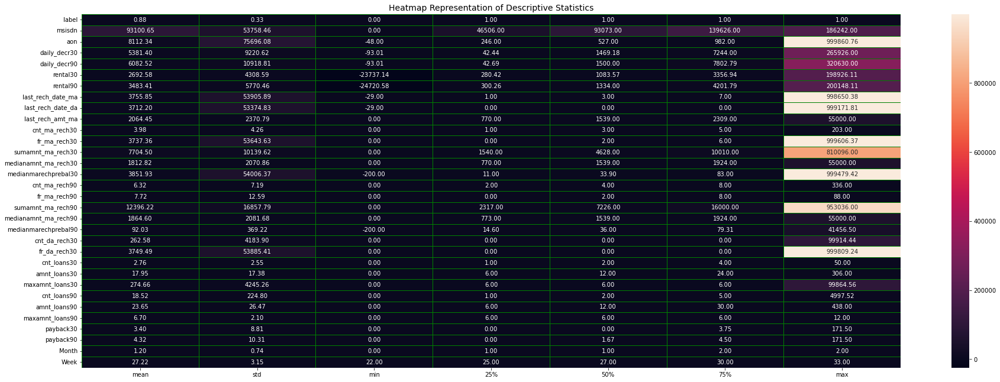

In [120]:
plt.figure(figsize=(31,11))
sns.heatmap(df.describe()[1:].transpose(),annot=True,linecolor='Green',linewidth='0.5',fmt='0.2f')
plt.title('Heatmap Representation of Descriptive Statistics',fontsize=14)
plt.show()

### Correlation

In [121]:
df.corr().label.sort_values()

Month                  -0.154949
medianmarechprebal30   -0.004829
aon                    -0.003785
fr_da_rech30           -0.000027
maxamnt_loans30         0.000248
fr_ma_rech30            0.001330
last_rech_date_da       0.001711
msisdn                  0.001976
last_rech_date_ma       0.003728
cnt_da_rech30           0.003827
cnt_loans90             0.004733
medianmarechprebal90    0.039300
payback30               0.048336
payback90               0.049183
rental30                0.058085
rental90                0.075521
maxamnt_loans90         0.084144
fr_ma_rech90            0.084385
medianamnt_ma_rech90    0.120855
last_rech_amt_ma        0.131804
medianamnt_ma_rech30    0.141490
Week                    0.162395
daily_decr90            0.166150
daily_decr30            0.168298
cnt_loans30             0.196283
amnt_loans30            0.197272
amnt_loans90            0.199788
sumamnt_ma_rech30       0.202828
sumamnt_ma_rech90       0.205793
cnt_ma_rech90           0.236392
cnt_ma_rec

See, there are ten attributes having almost zero correlation b/w label (which is our target variable) and other respective  attributes. Hence will remove all the zero correlated columns later in data cleaning phase.
Negative correlation means if input is +ve then output is -ve and vice-versa whereas, Positive correlation means if input is +ve then output would also be +ve and vice-versa.

The attributes those are giving zero correlations w.r.t. 'label' are--- maxamnt_loans30, fr_ma_rech30, last_rech_date_da,msisdn, last_rech_date_ma, cnt_da_rech30, cnt_loans90, medianmarechprebal30, aon and fr_da_rech30.

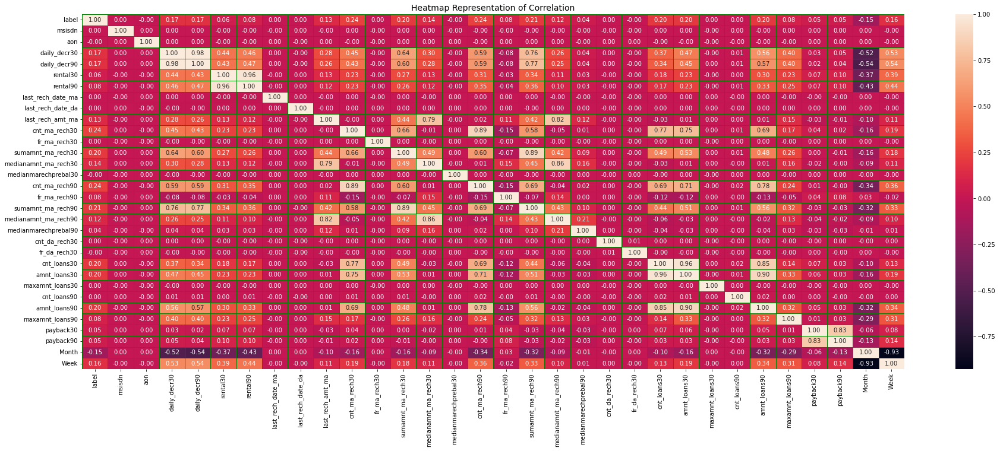

In [122]:
plt.figure(figsize=(31,11))
sns.heatmap(df.corr(),annot=True,linecolor='green',linewidth='1',fmt='0.2f')
plt.title('Heatmap Representation of Correlation',fontsize=14)
plt.show()

Let's consider threshold for correlation as 0.80 i.e. if any two variable are having correlation more than 80% then will drop those variables.
Here, Attributes (daily_decr30,daily_decr90), (cnt_loans30,amnt_loans30),(payback30,payback90) and (rental30,rental90) are 98%, 96%, 83% and 96% highly correlated w.r.t. each other respectively.Hence will drop one attributes out of each pair after comparing their correlation score w.r.t. Target Column.

Let's consider dropping the attributes as- daily_decr30, amnt_loans30, payback90 and rental30

### Multicollinearity

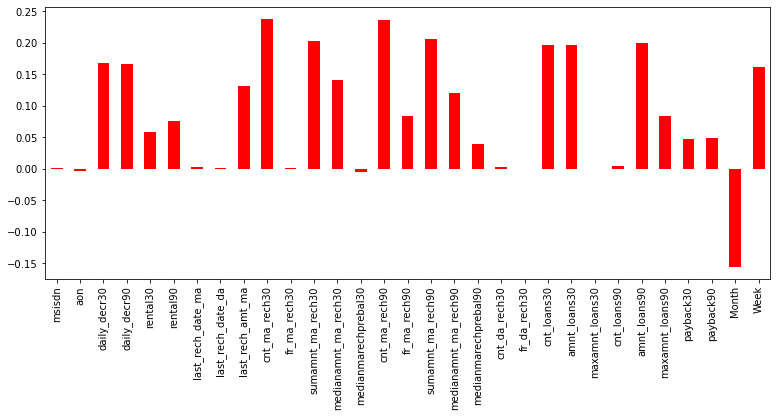

In [124]:
plt.figure(figsize=(13,5))
df.corr().label.drop(['label']).plot(kind='bar',color='r')
plt.show()

i'll check the multicollinearity later in the Data Cleansing portion when i'll be calculating the Variance inflation factor.

### Skewness

In [125]:
df.skew().sort_values()

label                   -2.270254
Month                   -0.343242
msisdn                   0.000719
Week                     0.112164
maxamnt_loans90          1.678304
fr_ma_rech90             2.285423
cnt_loans30              2.713421
amnt_loans30             2.975719
amnt_loans90             3.150006
cnt_ma_rech30            3.283842
cnt_ma_rech90            3.425254
medianamnt_ma_rech30     3.512324
medianamnt_ma_rech90     3.752706
last_rech_amt_ma         3.781149
daily_decr30             3.946230
daily_decr90             4.252565
rental90                 4.437681
rental30                 4.521929
sumamnt_ma_rech90        4.897950
sumamnt_ma_rech30        6.386787
payback90                6.899951
payback30                8.310695
aon                     10.392949
fr_ma_rech30            14.772833
fr_da_rech30            14.776430
medianmarechprebal30    14.779875
last_rech_date_ma       14.790974
last_rech_date_da       14.814857
cnt_loans90             16.594408
maxamnt_loans3

The threshold value of Skewness is +/=0.5. Attributes- Month,msisdn and Week are only in the range while others are either skewed right or left. Will remove skewness from thses columns later on in data cleansing part,also will not touch target column for removing the skewness.

### Distribution Plot
##### Here we can now check the normal distribution pattern for each of the attributes which are skewed left or right hand side

The Distribution Plot for attribute "label" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


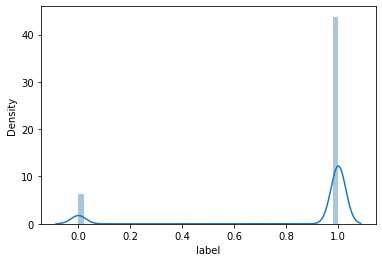



The Distribution Plot for attribute "msisdn" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


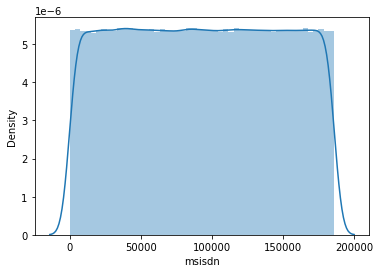



The Distribution Plot for attribute "aon" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


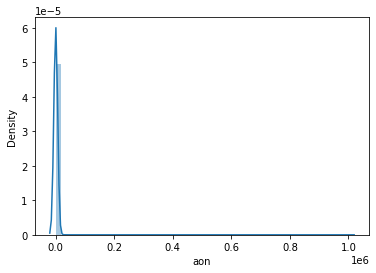



The Distribution Plot for attribute "daily_decr30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


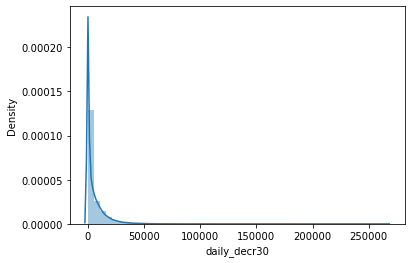



The Distribution Plot for attribute "daily_decr90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


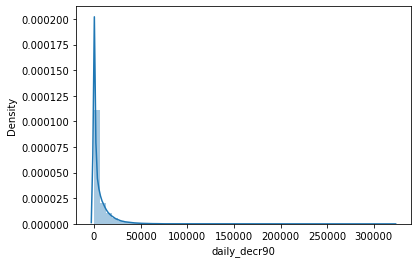



The Distribution Plot for attribute "rental30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


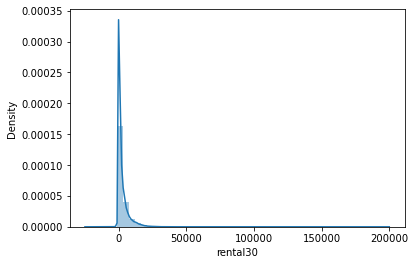



The Distribution Plot for attribute "rental90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


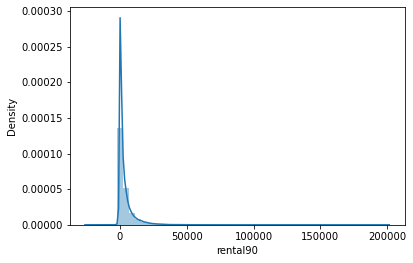



The Distribution Plot for attribute "last_rech_date_ma" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


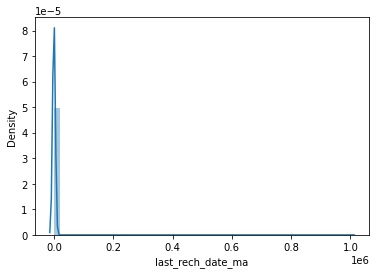



The Distribution Plot for attribute "last_rech_date_da" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


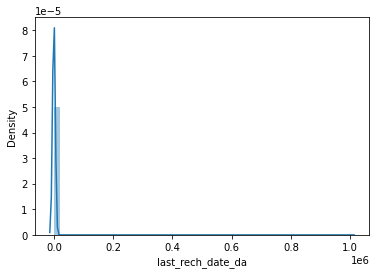



The Distribution Plot for attribute "last_rech_amt_ma" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


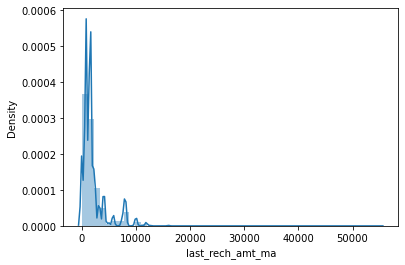



The Distribution Plot for attribute "cnt_ma_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


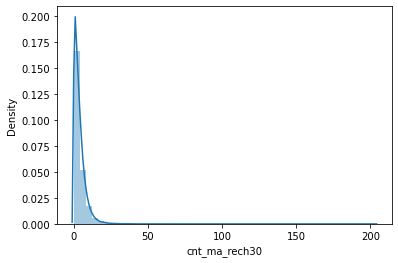



The Distribution Plot for attribute "fr_ma_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


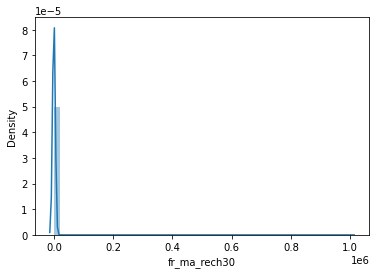



The Distribution Plot for attribute "sumamnt_ma_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


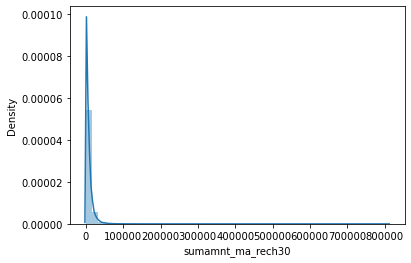



The Distribution Plot for attribute "medianamnt_ma_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


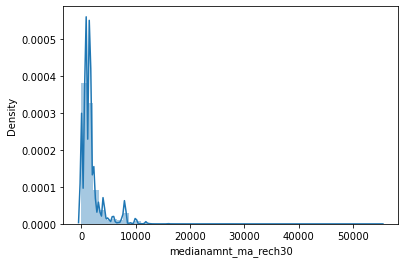



The Distribution Plot for attribute "medianmarechprebal30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


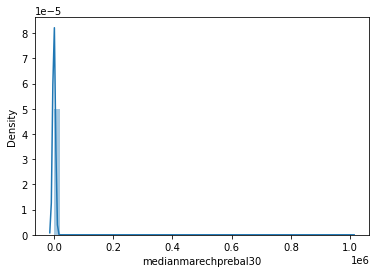



The Distribution Plot for attribute "cnt_ma_rech90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


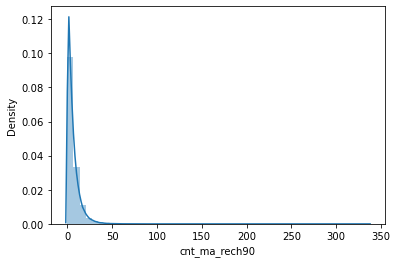



The Distribution Plot for attribute "fr_ma_rech90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


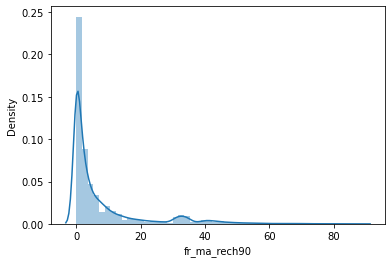



The Distribution Plot for attribute "sumamnt_ma_rech90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


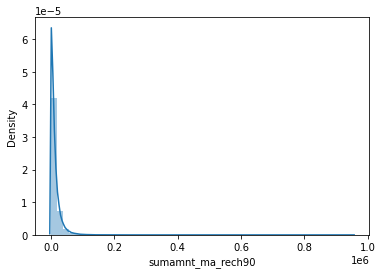



The Distribution Plot for attribute "medianamnt_ma_rech90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


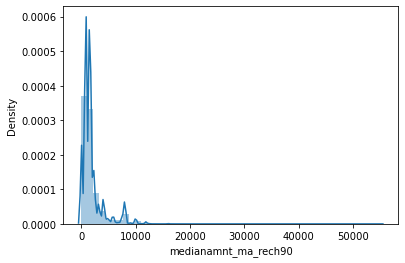



The Distribution Plot for attribute "medianmarechprebal90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


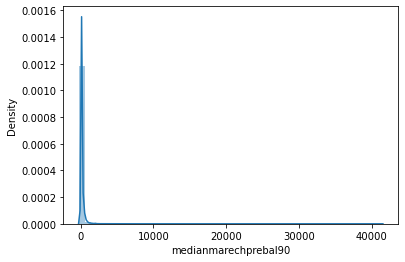



The Distribution Plot for attribute "cnt_da_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


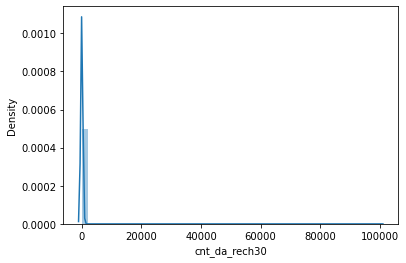



The Distribution Plot for attribute "fr_da_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


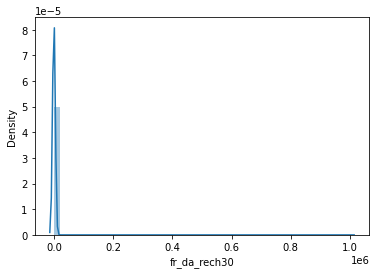



The Distribution Plot for attribute "cnt_loans30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


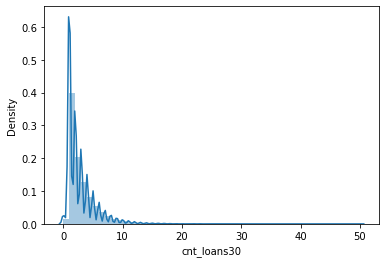



The Distribution Plot for attribute "amnt_loans30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


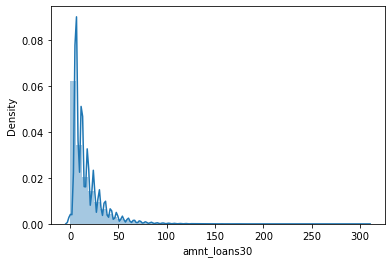



The Distribution Plot for attribute "maxamnt_loans30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


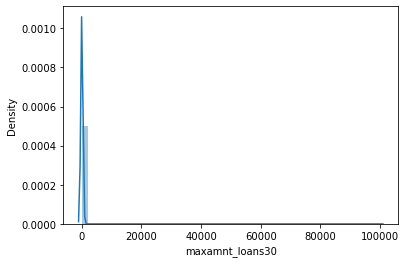



The Distribution Plot for attribute "cnt_loans90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


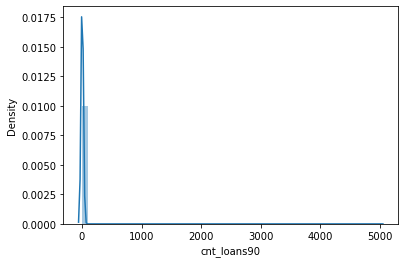



The Distribution Plot for attribute "amnt_loans90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


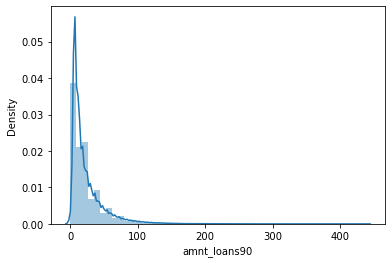



The Distribution Plot for attribute "maxamnt_loans90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


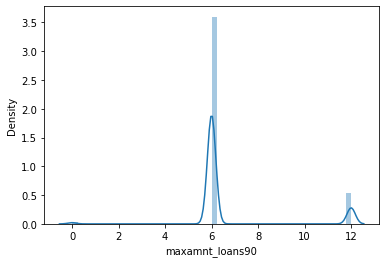



The Distribution Plot for attribute "payback30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


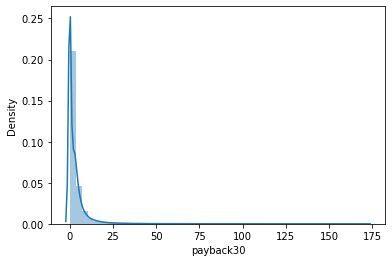



The Distribution Plot for attribute "payback90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


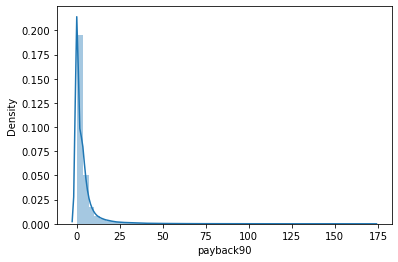



The Distribution Plot for attribute "Month" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


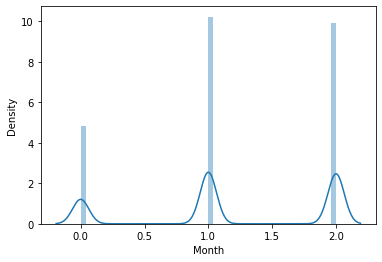



The Distribution Plot for attribute "Week" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


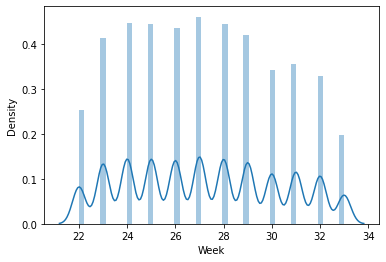

In [126]:
for i in df.columns:
    print(f'The Distribution Plot for attribute "{i}" is-\n {sns.distplot(df[i])}')
    plt.show()
    print('\n')

As we can see in the above distribution plots all of the attributes are skewed both right ad left hand side.Ergo,i'll remove the skewness later on the data cleansing section by power transfrorm or boxcox method or sqrt method or log method

### Outliers

In [128]:
z=np.abs(zscore(df))
np.where(z>3)

(array([    21,     22,     22, ..., 209580, 209581, 209586], dtype=int64),
 array([16, 16, 29, ..., 27,  4, 26], dtype=int64))

we can see that there are lots of rows and columns are present having outliers

In [129]:
print(z.iloc[21,16])
print(z.iloc[22,16])
print(z.iloc[22,29])

4.4703916213001245
4.629245062683489
3.6552396504837366


### Boxplots To check the Outliers

The Box-Plot for attribute "label" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


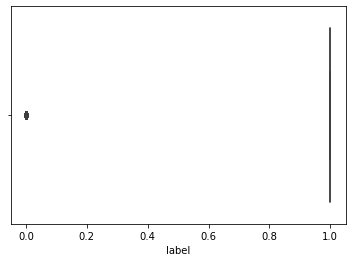



The Box-Plot for attribute "msisdn" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


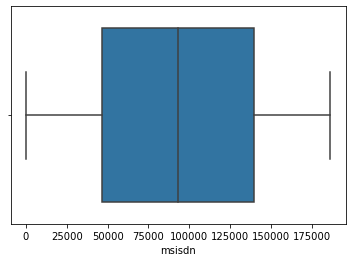



The Box-Plot for attribute "aon" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


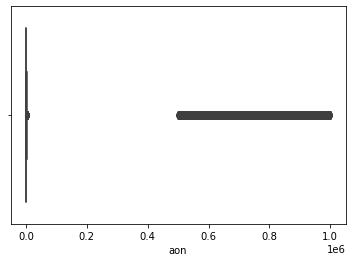



The Box-Plot for attribute "daily_decr30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


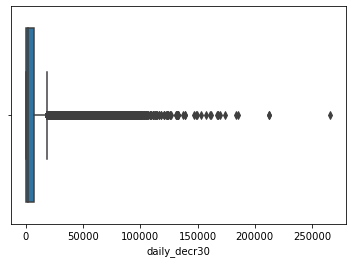



The Box-Plot for attribute "daily_decr90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


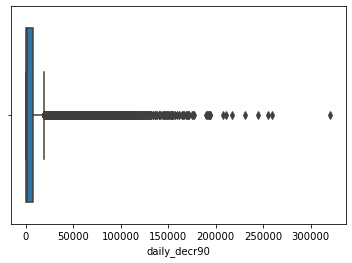



The Box-Plot for attribute "rental30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


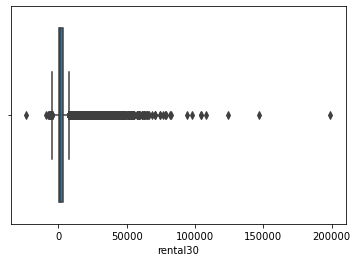



The Box-Plot for attribute "rental90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


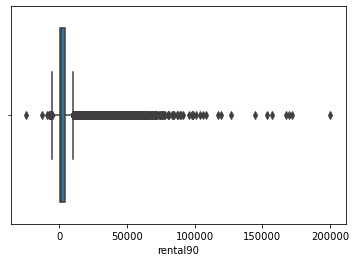



The Box-Plot for attribute "last_rech_date_ma" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


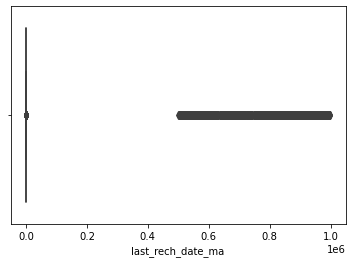



The Box-Plot for attribute "last_rech_date_da" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


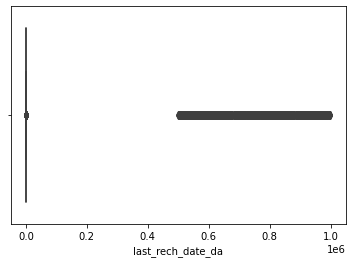



The Box-Plot for attribute "last_rech_amt_ma" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


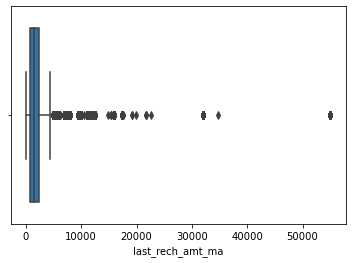



The Box-Plot for attribute "cnt_ma_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


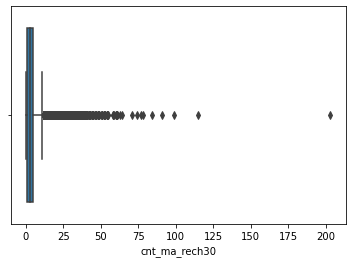



The Box-Plot for attribute "fr_ma_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


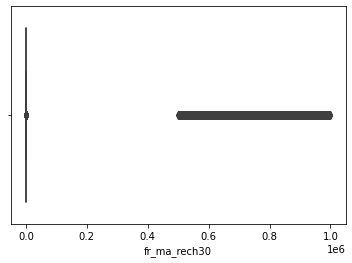



The Box-Plot for attribute "sumamnt_ma_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


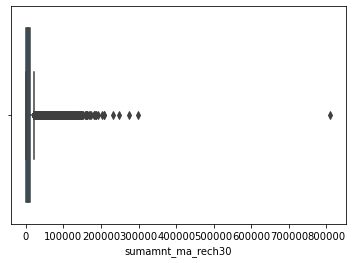



The Box-Plot for attribute "medianamnt_ma_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


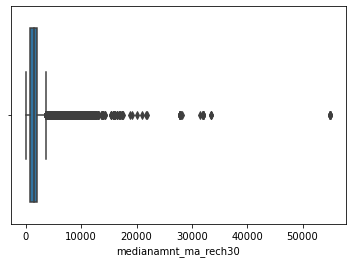



The Box-Plot for attribute "medianmarechprebal30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


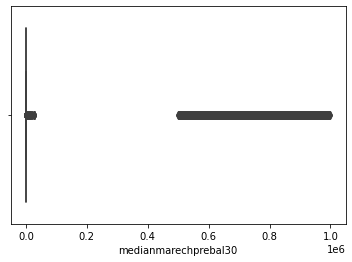



The Box-Plot for attribute "cnt_ma_rech90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


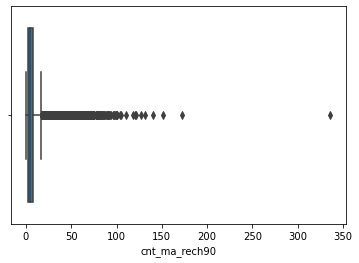



The Box-Plot for attribute "fr_ma_rech90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


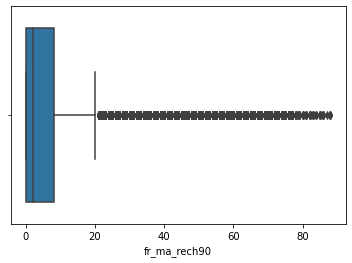



The Box-Plot for attribute "sumamnt_ma_rech90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


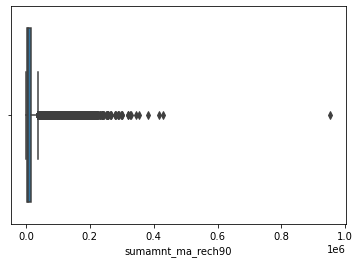



The Box-Plot for attribute "medianamnt_ma_rech90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


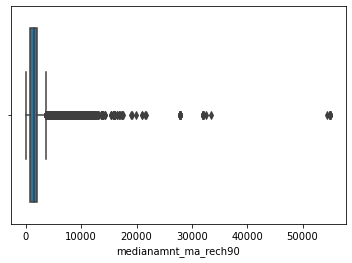



The Box-Plot for attribute "medianmarechprebal90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


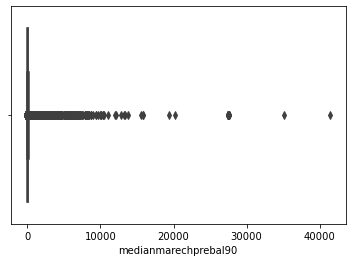



The Box-Plot for attribute "cnt_da_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


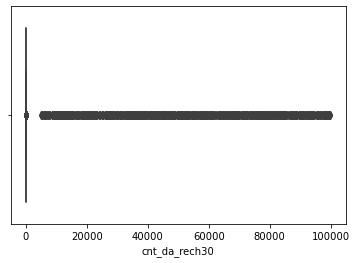



The Box-Plot for attribute "fr_da_rech30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


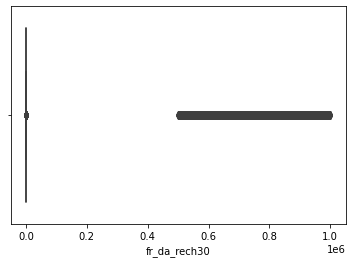



The Box-Plot for attribute "cnt_loans30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


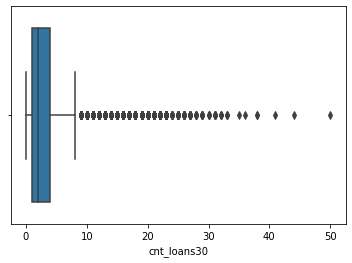



The Box-Plot for attribute "amnt_loans30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


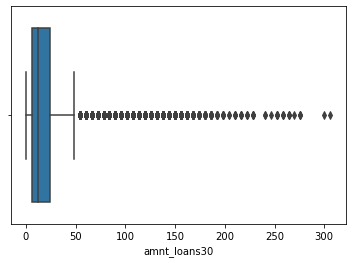



The Box-Plot for attribute "maxamnt_loans30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


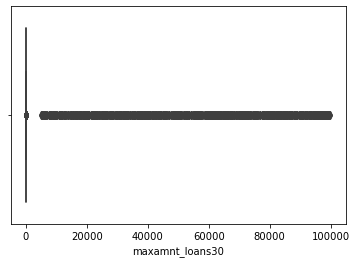



The Box-Plot for attribute "cnt_loans90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


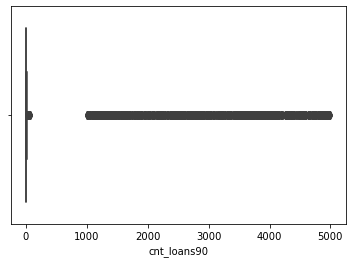



The Box-Plot for attribute "amnt_loans90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


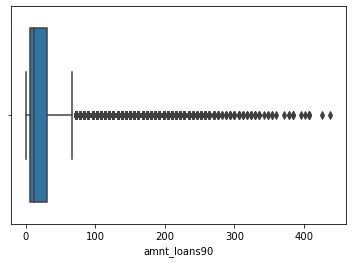



The Box-Plot for attribute "maxamnt_loans90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


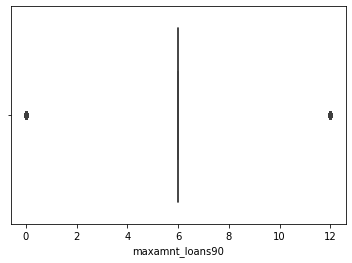



The Box-Plot for attribute "payback30" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


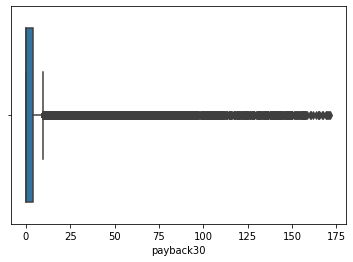



The Box-Plot for attribute "payback90" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


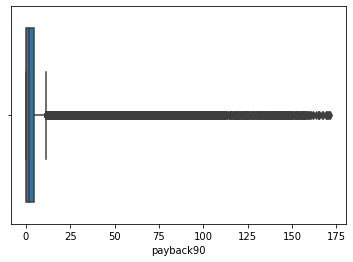



The Box-Plot for attribute "Month" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


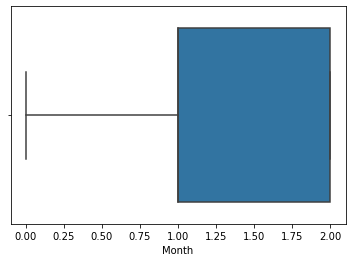



The Box-Plot for attribute "Week" is-
 AxesSubplot(0.125,0.125;0.775x0.755)


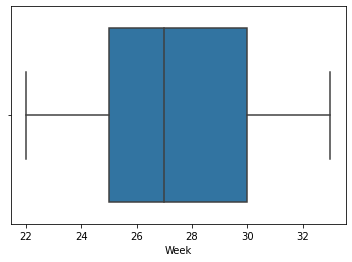

In [130]:
for i in df.columns:
    print(f'The Box-Plot for attribute "{i}" is-\n {sns.boxplot(df[i])}')
    plt.show()
    print('\n')

Except attributes 'Week' and 'Month' outliers are almost present in each attributes.

### Data Cleansing
### 1.Remove Negative Correlation

In [131]:
#will drop all the zero correlated columns w.r.t. Target variable 'Label' and also highly correlated variables w.r.t. each other having correlation more than 80%
df1=df.drop(['daily_decr30','amnt_loans30', 'payback90', 'rental30','maxamnt_loans30', 'fr_ma_rech30', 'last_rech_date_da','msisdn', 'last_rech_date_ma', 'cnt_da_rech30', 'cnt_loans90', 'medianmarechprebal30', 'aon', 'fr_da_rech30'],axis=1)
df1

,label,daily_decr90,rental90,last_rech_amt_ma,cnt_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans90,maxamnt_loans90,payback30,Month,Week
0,0,3065.150000,260.13,1539,2,3078.0,1539.0,2,21,3078,1539.0,7.50,2,12,6,29.000000,1,29
1,1,12124.750000,3691.26,5787,1,5787.0,5787.0,1,0,5787,5787.0,61.04,1,12,12,0.000000,0,32
2,1,1398.000000,900.13,1539,1,1539.0,1539.0,1,0,1539,1539.0,66.32,1,6,6,0.000000,0,33
3,1,21.228000,159.42,947,0,0.0,0.0,1,0,947,947.0,2.50,2,12,6,0.000000,2,23
4,1,150.619333,1098.90,2309,7,20029.0,2309.0,8,2,23496,2888.0,35.00,7,42,6,2.333333,2,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,1,151.872333,1089.19,4048,3,10404.0,3178.0,3,2,10404,3178.0,91.81,2,12,6,1.000000,2,24
209589,1,36.936000,1728.36,773,4,3092.0,773.0,6,2,4038,773.0,111.80,3,18,6,1.000000,2,23
209590,1,11904.350000,8893.20,1539,5,9334.0,1539.0,11,5,18592,1539.0,47.13,4,54,12,4.000000,1,30
209591,1,12574.370000,984.58,773,5,12154.0,773.0,6,4,17941,2410.5,100.00,2,24,12,0.000000,1,30


### 2.Removing Multicollinearity

In [135]:
x=df1.drop('label',axis=1)
x

,daily_decr90,rental90,last_rech_amt_ma,cnt_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans90,maxamnt_loans90,payback30,Month,Week
0,3065.150000,260.13,1539,2,3078.0,1539.0,2,21,3078,1539.0,7.50,2,12,6,29.000000,1,29
1,12124.750000,3691.26,5787,1,5787.0,5787.0,1,0,5787,5787.0,61.04,1,12,12,0.000000,0,32
2,1398.000000,900.13,1539,1,1539.0,1539.0,1,0,1539,1539.0,66.32,1,6,6,0.000000,0,33
3,21.228000,159.42,947,0,0.0,0.0,1,0,947,947.0,2.50,2,12,6,0.000000,2,23
4,150.619333,1098.90,2309,7,20029.0,2309.0,8,2,23496,2888.0,35.00,7,42,6,2.333333,2,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,151.872333,1089.19,4048,3,10404.0,3178.0,3,2,10404,3178.0,91.81,2,12,6,1.000000,2,24
209589,36.936000,1728.36,773,4,3092.0,773.0,6,2,4038,773.0,111.80,3,18,6,1.000000,2,23
209590,11904.350000,8893.20,1539,5,9334.0,1539.0,11,5,18592,1539.0,47.13,4,54,12,4.000000,1,30
209591,12574.370000,984.58,773,5,12154.0,773.0,6,4,17941,2410.5,100.00,2,24,12,0.000000,1,30


In [136]:
import statsmodels.api
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [137]:
def vif():
    df2=pd.DataFrame()
    df2['Features']=x.columns
    df2['VIF_Score']=[variance_inflation_factor(x.values,k) for k in range(x.shape[1])]
    print(df2)

In [138]:
vif()

                Features  VIF_Score
0           daily_decr90   4.951919
1               rental90   1.900775
2       last_rech_amt_ma   6.032030
3          cnt_ma_rech30  27.506134
4      sumamnt_ma_rech30  18.798348
5   medianamnt_ma_rech30   8.921903
6          cnt_ma_rech90  27.988878
7           fr_ma_rech90   1.461065
8      sumamnt_ma_rech90  22.346395
9   medianamnt_ma_rech90  10.139349
10  medianmarechprebal90   1.130878
11           cnt_loans30  16.886722
12          amnt_loans90  16.181650
13       maxamnt_loans90  14.542501
14             payback30   1.183985
15                 Month   4.444691
16                  Week  17.508162


As we can see that attributes (cnt_ma_rech30,cnt_ma_rech90) and (cnt_loans30,amnt_loans90) are highly correlated w.r.t each other i.e. they are providing the same amount of information to the label,hence will drop attributes from each pair having less correlation score w.r.t. label. I'm considering dropping variables- cnt_loans30,cnt_ma_rech90

In [139]:
df3=df1.drop(['cnt_loans30','cnt_ma_rech90'],axis=1)
df3

,label,daily_decr90,rental90,last_rech_amt_ma,cnt_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,amnt_loans90,maxamnt_loans90,payback30,Month,Week
0,0,3065.150000,260.13,1539,2,3078.0,1539.0,21,3078,1539.0,7.50,12,6,29.000000,1,29
1,1,12124.750000,3691.26,5787,1,5787.0,5787.0,0,5787,5787.0,61.04,12,12,0.000000,0,32
2,1,1398.000000,900.13,1539,1,1539.0,1539.0,0,1539,1539.0,66.32,6,6,0.000000,0,33
3,1,21.228000,159.42,947,0,0.0,0.0,0,947,947.0,2.50,12,6,0.000000,2,23
4,1,150.619333,1098.90,2309,7,20029.0,2309.0,2,23496,2888.0,35.00,42,6,2.333333,2,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,1,151.872333,1089.19,4048,3,10404.0,3178.0,2,10404,3178.0,91.81,12,6,1.000000,2,24
209589,1,36.936000,1728.36,773,4,3092.0,773.0,2,4038,773.0,111.80,18,6,1.000000,2,23
209590,1,11904.350000,8893.20,1539,5,9334.0,1539.0,5,18592,1539.0,47.13,54,12,4.000000,1,30
209591,1,12574.370000,984.58,773,5,12154.0,773.0,4,17941,2410.5,100.00,24,12,0.000000,1,30


### 3.Removing Outliers

In [140]:
df4=df3[(z<3).all(axis=1)]
df4

,label,daily_decr90,rental90,last_rech_amt_ma,cnt_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,amnt_loans90,maxamnt_loans90,payback30,Month,Week
0,0,3065.150000,260.13,1539,2,3078.0,1539.0,21,3078,1539.0,7.50,12,6,29.000000,1,29
1,1,12124.750000,3691.26,5787,1,5787.0,5787.0,0,5787,5787.0,61.04,12,12,0.000000,0,32
2,1,1398.000000,900.13,1539,1,1539.0,1539.0,0,1539,1539.0,66.32,6,6,0.000000,0,33
3,1,21.228000,159.42,947,0,0.0,0.0,0,947,947.0,2.50,12,6,0.000000,2,23
4,1,150.619333,1098.90,2309,7,20029.0,2309.0,2,23496,2888.0,35.00,42,6,2.333333,2,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,1,151.872333,1089.19,4048,3,10404.0,3178.0,2,10404,3178.0,91.81,12,6,1.000000,2,24
209589,1,36.936000,1728.36,773,4,3092.0,773.0,2,4038,773.0,111.80,18,6,1.000000,2,23
209590,1,11904.350000,8893.20,1539,5,9334.0,1539.0,5,18592,1539.0,47.13,54,12,4.000000,1,30
209591,1,12574.370000,984.58,773,5,12154.0,773.0,4,17941,2410.5,100.00,24,12,0.000000,1,30


In [141]:
print(df4.shape)
print(df3.shape)

(168755, 16)
(209593, 16)


In [142]:
percentage_loss=(209593-168755)*100/209593
percentage_loss

19.484429346399928

Since data is expensive and we can't lose more than 7-8% of the data but here after removing outliers I'm lossing more than 19% data which is against the instructions of the client hence will not consider the outliers removal for the same. Hence going forward will consider the dataframe as df3

### 4.Removing Skewness
### Power Transformer Method

In [143]:
df3.skew().sort_values()

label                   -2.270254
Month                   -0.343242
Week                     0.112164
maxamnt_loans90          1.678304
fr_ma_rech90             2.285423
amnt_loans90             3.150006
cnt_ma_rech30            3.283842
medianamnt_ma_rech30     3.512324
medianamnt_ma_rech90     3.752706
last_rech_amt_ma         3.781149
daily_decr90             4.252565
rental90                 4.437681
sumamnt_ma_rech90        4.897950
sumamnt_ma_rech30        6.386787
payback30                8.310695
medianmarechprebal90    44.880503
dtype: float64

As we can see that Only attributes Month & Week are free from skewness and also label is the target variable here in this project ergo will not remove the skewness in this target variable even skewness is present.So will drop these three columns and apply Power Transformer method to remove the skewness

In [165]:
x=df3.drop(['label','Month','Week'],axis=1)
x

,daily_decr90,rental90,last_rech_amt_ma,cnt_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,amnt_loans90,maxamnt_loans90,payback30
0,3065.150000,260.13,1539,2,3078.0,1539.0,21,3078,1539.0,7.50,12,6,29.000000
1,12124.750000,3691.26,5787,1,5787.0,5787.0,0,5787,5787.0,61.04,12,12,0.000000
2,1398.000000,900.13,1539,1,1539.0,1539.0,0,1539,1539.0,66.32,6,6,0.000000
3,21.228000,159.42,947,0,0.0,0.0,0,947,947.0,2.50,12,6,0.000000
4,150.619333,1098.90,2309,7,20029.0,2309.0,2,23496,2888.0,35.00,42,6,2.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,151.872333,1089.19,4048,3,10404.0,3178.0,2,10404,3178.0,91.81,12,6,1.000000
209589,36.936000,1728.36,773,4,3092.0,773.0,2,4038,773.0,111.80,18,6,1.000000
209590,11904.350000,8893.20,1539,5,9334.0,1539.0,5,18592,1539.0,47.13,54,12,4.000000
209591,12574.370000,984.58,773,5,12154.0,773.0,4,17941,2410.5,100.00,24,12,0.000000


In [166]:
import sklearn
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer(method='yeo-johnson')
x=pt.fit_transform(x)
x

array([[ 0.29918139, -0.56841051,  0.08341679, ..., -0.25085016,
        -0.28561065,  1.81326608],
       [ 1.04508395,  0.14808237,  1.50127701, ..., -0.25085016,
         2.32582829, -0.93740539],
       [-0.02820272, -0.40904715,  0.08341679, ..., -1.00571394,
        -0.28561065, -0.93740539],
       ...,
       [ 1.03342361,  1.02247562,  0.08341679, ...,  1.35845482,
         2.32582829,  0.97429196],
       [ 1.06838077, -0.3898197 , -0.42950922, ...,  0.50373963,
         2.32582829, -0.93740539],
       [ 0.48715657, -0.47243843,  1.87039581, ...,  0.19226023,
         2.32582829, -0.93740539]])

### Using Standard Scaler

In [169]:
x=df3.drop(['label'],axis=1)
x

,daily_decr90,rental90,last_rech_amt_ma,cnt_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,amnt_loans90,maxamnt_loans90,payback30,Month,Week
0,3065.150000,260.13,1539,2,3078.0,1539.0,21,3078,1539.0,7.50,12,6,29.000000,1,29
1,12124.750000,3691.26,5787,1,5787.0,5787.0,0,5787,5787.0,61.04,12,12,0.000000,0,32
2,1398.000000,900.13,1539,1,1539.0,1539.0,0,1539,1539.0,66.32,6,6,0.000000,0,33
3,21.228000,159.42,947,0,0.0,0.0,0,947,947.0,2.50,12,6,0.000000,2,23
4,150.619333,1098.90,2309,7,20029.0,2309.0,2,23496,2888.0,35.00,42,6,2.333333,2,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,151.872333,1089.19,4048,3,10404.0,3178.0,2,10404,3178.0,91.81,12,6,1.000000,2,24
209589,36.936000,1728.36,773,4,3092.0,773.0,2,4038,773.0,111.80,18,6,1.000000,2,23
209590,11904.350000,8893.20,1539,5,9334.0,1539.0,5,18592,1539.0,47.13,54,12,4.000000,1,30
209591,12574.370000,984.58,773,5,12154.0,773.0,4,17941,2410.5,100.00,24,12,0.000000,1,30


In [170]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[-0.27634619, -0.55858346, -0.22163706, ...,  2.9046997 ,
        -0.27336037,  0.56551967],
       [ 0.5533797 ,  0.03602034,  1.570178  , ..., -0.38562959,
        -1.62209905,  1.51665297],
       [-0.42903256, -0.44767352, -0.22163706, ..., -0.38562959,
        -1.62209905,  1.8336974 ],
       ...,
       [ 0.53319431,  0.93749981, -0.22163706, ...,  0.06820893,
        -0.27336037,  0.8825641 ],
       [ 0.59455827, -0.4330386 , -0.54473742, ..., -0.38562959,
        -0.27336037,  0.8825641 ],
       [-0.14174607, -0.49427822,  2.30369175, ..., -0.38562959,
        -0.27336037, -0.0685692 ]])

Mean is= -1.857778738777225e-17
Standard_Deviation= 1.0


AxesSubplot(0.125,0.125;0.775x0.755)


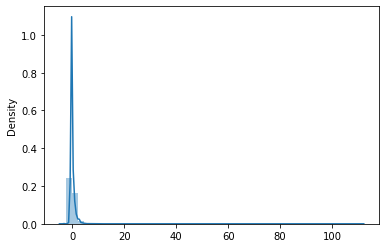

In [172]:
print('Mean is=',x.mean())
print('Standard_Deviation=',x.std())
print('\n')
print(sns.distplot(x))
plt.show()

Now,almost our features is normally distributed as we have got the mean almost as zero and standard deviation=1 i.e. data is fully normalized and transformed.

### Using Principle Component Analysis(PCA)

In [176]:
#reducing the dimension to 5 components
from sklearn.decomposition import PCA
pca=PCA(n_components=5)
x=pca.fit_transform(x)
x

array([[-0.84067618, -0.12201817, -1.23799903, -2.66432227,  1.15802051],
       [ 2.3485158 ,  1.63068303, -2.64298181,  0.99602848, -0.68428686],
       [-0.40787209, -0.662525  , -2.15885212,  0.90093441, -0.17418715],
       ...,
       [ 1.73546065, -1.38028757, -0.46525897,  0.19793907, -0.19427572],
       [ 1.12605102, -0.89839779, -0.29175268,  0.75056378, -0.32726978],
       [ 1.93033386,  3.24149417, -1.04579993,  0.41318975, -0.12114629]])

In [178]:
y=df3.label
y

0         0
1         1
2         1
3         1
4         1
         ..
209588    1
209589    1
209590    1
209591    1
209592    1
Name: label, Length: 209593, dtype: int64

### Plotting the Relationship b/w Principle Components

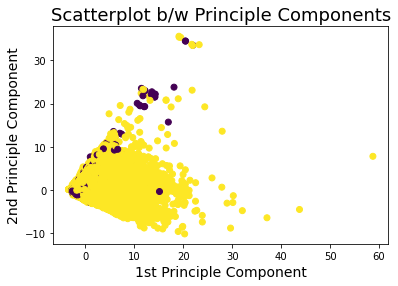

In [179]:
plt.scatter(x[:,0],x[:,1],c=y)
plt.xlabel('1st Principle Component',fontsize=14)
plt.ylabel('2nd Principle Component',fontsize=14)
plt.title('Scatterplot b/w Principle Components',fontsize=18)
plt.show()

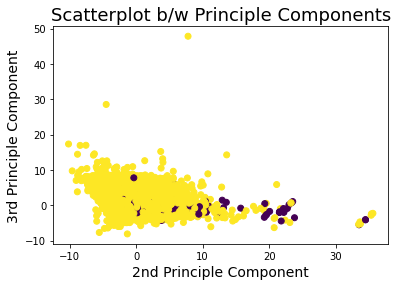

In [180]:
plt.scatter(x[:,1],x[:,2],c=y)
plt.xlabel('2nd Principle Component',fontsize=14)
plt.ylabel('3rd Principle Component',fontsize=14)
plt.title('Scatterplot b/w Principle Components',fontsize=18)
plt.show()

Above two diagrams shows that our feature variables are distributed and mixed well that's a good sign going forward

### Using IMBlearn Balancing Techniques

In [181]:
y.value_counts()

1    183431
0     26162
Name: label, dtype: int64

In [182]:
!pip install -U imbalanced-learn

In [183]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x,y=sm.fit_resample(x,y)

In [184]:
y.value_counts()

0    183431
1    183431
Name: label, dtype: int64

In this case, Label ‘1’ indicates that the loan has been paid i.e. Non- defaulter, while, Label ‘0’ indicates that the loan has not been paid i.e. defaulter

In [185]:
print(x.shape)
print(y.shape)

(366862, 5)
(366862,)


### Training_Testing Phase
##### I am going to train 80% of the data and testing size would be 20%
##### first will try to find out the best value for random_state

In [186]:
#importing machine learning libraries for Classification model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,roc_auc_score,roc_curve
lr=LogisticRegression()

In [187]:
#finding out the best random_state 
for i in range(0,44):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=i)
    lr.fit(x_train,y_train)
    pred_test=lr.predict(x_test)
    pred_train=lr.predict(x_train)
    if accuracy_score(pred_train,y_train)==accuracy_score(pred_test,y_test):
        print(f'At random_state-{i} The Logistic Regression Model performs really well')
        print(f'Training accuracy of the model is\t {accuracy_score(pred_train,y_train)}')
        print(f'Testing accuracy of the model is\t {accuracy_score(pred_test,y_test)}')
        print(f'Confusion Matrix for the model is\t {Confusion_matrix(pred_test,y_test)}')
        print(f'Classification Report for the model is\t {classification_report(pred_test,y_test)}')
        print('\n')
    else:
        print(f'At random_state-{i} The Training and Testing Accuracy of the model is different')
        print(f'Training accuracy of the model is\t {accuracy_score(pred_train,y_train)}')
        print(f'Testing accuracy of the model is\t {accuracy_score(pred_test,y_test)}')
        print(f'Confusion Matrix for the model is\n {confusion_matrix(pred_test,y_test)}')
        print(f'Classification Report for the model is\n {classification_report(pred_test,y_test)}')
        print('\n')  

At random_state-0 The Training and Testing Accuracy of the model is different
Training accuracy of the model is	 0.7281533549809363
Testing accuracy of the model is	 0.7268750085181197
Confusion Matrix for the model is
 [[29943 13553]
 [ 6487 23390]]
Classification Report for the model is
               precision    recall  f1-score   support

           0       0.82      0.69      0.75     43496
           1       0.63      0.78      0.70     29877

    accuracy                           0.73     73373
   macro avg       0.73      0.74      0.72     73373
weighted avg       0.75      0.73      0.73     73373



At random_state-1 The Training and Testing Accuracy of the model is different
Training accuracy of the model is	 0.727659298985652
Testing accuracy of the model is	 0.7292737110381203
Confusion Matrix for the model is
 [[30195 13352]
 [ 6512 23314]]
Classification Report for the model is
               precision    recall  f1-score   support

           0       0.82      0.69  

In [188]:
#choosing random_state as 5
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=5)
lr.fit(x_train,y_train)
pred_test=lr.predict(x_test)
pred_train=lr.predict(x_train)
print(f'At random_state-{5} The Training and Testing Accuracy of the model is almost same')
print(f'Training accuracy of the model is\t {accuracy_score(pred_train,y_train)}')
print(f'Testing accuracy of the model is\t {accuracy_score(pred_test,y_test)}')
print(f'Confusion Matrix for the model is\n {confusion_matrix(pred_test,y_test)}')
print(f'Classification Report for the model is\n {classification_report(pred_test,y_test)}')

At random_state-5 The Training and Testing Accuracy of the model is almost same
Training accuracy of the model is	 0.7277001863783651
Testing accuracy of the model is	 0.7290692761642567
Confusion Matrix for the model is
 [[30191 13424]
 [ 6455 23303]]
Classification Report for the model is
               precision    recall  f1-score   support

           0       0.82      0.69      0.75     43615
           1       0.63      0.78      0.70     29758

    accuracy                           0.73     73373
   macro avg       0.73      0.74      0.73     73373
weighted avg       0.75      0.73      0.73     73373



At random_state 5 I'm getting almost equal training and testing accuracy score and equal f1-score too,which indicates model is performing well and now let's try few more models so that we can make a strong prediction going forward

### Finding Out CV Score

In [189]:
from sklearn.model_selection import cross_val_score

In [190]:
for i in range(2,6):
    cvs=cross_val_score(lr,x,y,cv=i)
    mean=cvs.mean()
    std=cvs.std()
    print(f'At K-Fold {i} the CV Score of the logistic model is {mean} and standard deviation is {std}\n')

At K-Fold 2 the CV Score of the logistic model is 0.7278540704679144 and standard deviation is 0.0003325501142119047

At K-Fold 3 the CV Score of the logistic model is 0.728014894362717 and standard deviation is 0.00014265139288011477

At K-Fold 4 the CV Score of the logistic model is 0.7279658312000572 and standard deviation is 0.0006664480629523095

At K-Fold 5 the CV Score of the logistic model is 0.7280285233685146 and standard deviation is 0.0010208800918554977



In [192]:
cvs=cross_val_score(lr,x,y,cv=2)
mean=cvs.mean()
std=cvs.std()
print(f'At K-Fold 2 the CV Score of the logistic model is {mean} and standard deviation is {std}\n')

At K-Fold 2 the CV Score of the logistic model is 0.7278540704679144 and standard deviation is 0.0003325501142119047



At each K-Fold I'm getting the same CV score which means model is very geniune and behaving well at each stages of training.
Now lets find out CV score for other models as well.

In [193]:
#importing other models of classification
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.metrics import roc_curve,roc_auc_score
gb=GaussianNB()
neighbor=KNeighborsClassifier()
dtc=DecisionTreeClassifier()
rfc=RandomForestClassifier()
ad=AdaBoostClassifier()
grd=GradientBoostingClassifier()

In [195]:
#creating a definition to expand the model individually
def model(algorithm,x,y):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=5)
    algorithm.fit(x_train,y_train)
    pred_train_x=algorithm.predict(x_train)
    pred_test_y=algorithm.predict(x_test)
    print(f'For model {algorithm}')
    print('Training_Accuracy_Score=',accuracy_score(y_train,pred_train_x))
    print('Testing_Accuracy_Score=',accuracy_score(y_test,pred_test_y))
    print('\n Classification Report-\n',classification_report(y_test,pred_test_y))
    print('\n Confusion Metrix-\n',confusion_matrix(y_test,pred_test_y))
    print('\n\nAUC_ROC CURVE')
    prob=algorithm.predict_proba(x_test)[:,1]
    FPR,TPR,THRESHOLD=roc_curve(y_test,prob)
    plt.plot(FPR,TPR)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC_Curve for the model {algorithm}')
    plt.show()
    ROC_AUC_SCORE=roc_auc_score(y_test,pred_test_y)
    print('ROC AUC SCORE is-',ROC_AUC_SCORE)
    print('\n')
    print('Finding out the best K-Fold Value')
    print('\n\t')
    for l in range(2,3):
        cvscore=cross_val_score(algorithm,x,y,cv=l)
        cv_accuracy_score=cvscore.mean()
        print(f'At the K-Fold {l} the CV score of model {algorithm} is {cv_accuracy_score}')
        print('\n')

For model LogisticRegression()
Training_Accuracy_Score= 0.7277001863783651
Testing_Accuracy_Score= 0.7290692761642567

 Classification Report-
               precision    recall  f1-score   support

           0       0.69      0.82      0.75     36646
           1       0.78      0.63      0.70     36727

    accuracy                           0.73     73373
   macro avg       0.74      0.73      0.73     73373
weighted avg       0.74      0.73      0.73     73373


 Confusion Metrix-
 [[30191  6455]
 [13424 23303]]


AUC_ROC CURVE


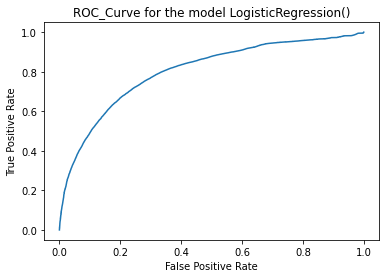

ROC AUC SCORE is- 0.7291737996075633


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model LogisticRegression() is 0.7278540704679144




In [196]:
model(lr,x,y)

For model GaussianNB()
Training_Accuracy_Score= 0.7140506117776134
Testing_Accuracy_Score= 0.7130415820533439

 Classification Report-
               precision    recall  f1-score   support

           0       0.66      0.87      0.75     36646
           1       0.81      0.55      0.66     36727

    accuracy                           0.71     73373
   macro avg       0.74      0.71      0.71     73373
weighted avg       0.74      0.71      0.71     73373


 Confusion Metrix-
 [[32035  4611]
 [16444 20283]]


AUC_ROC CURVE


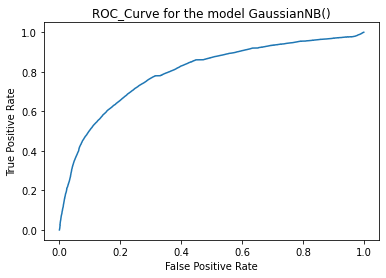

ROC AUC SCORE is- 0.713219268349086


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GaussianNB() is 0.7132872851371905




In [197]:
model(gb,x,y)

For model KNeighborsClassifier()
Training_Accuracy_Score= 0.9165863115823761
Testing_Accuracy_Score= 0.8820683357638368

 Classification Report-
               precision    recall  f1-score   support

           0       0.83      0.96      0.89     36646
           1       0.96      0.80      0.87     36727

    accuracy                           0.88     73373
   macro avg       0.89      0.88      0.88     73373
weighted avg       0.89      0.88      0.88     73373


 Confusion Metrix-
 [[35320  1326]
 [ 7327 29400]]


AUC_ROC CURVE


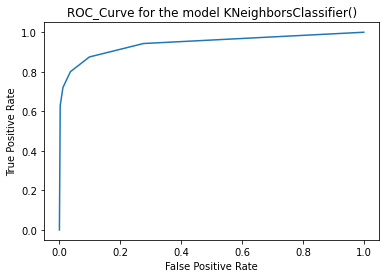

ROC AUC SCORE is- 0.8821584814099854


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model KNeighborsClassifier() is 0.8627740131166488




In [198]:
model(neighbor,x,y)

For model DecisionTreeClassifier()
Training_Accuracy_Score= 0.9989948515958008
Testing_Accuracy_Score= 0.8537064042631486

 Classification Report-
               precision    recall  f1-score   support

           0       0.84      0.87      0.86     36646
           1       0.87      0.83      0.85     36727

    accuracy                           0.85     73373
   macro avg       0.85      0.85      0.85     73373
weighted avg       0.85      0.85      0.85     73373


 Confusion Metrix-
 [[32049  4597]
 [ 6137 30590]]


AUC_ROC CURVE


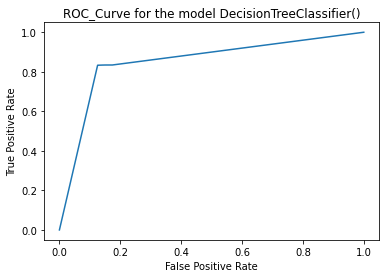

ROC AUC SCORE is- 0.8537293963845135


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model DecisionTreeClassifier() is 0.8355076295718826




In [199]:
model(dtc,x,y)

For model RandomForestClassifier()
Training_Accuracy_Score= 0.998964186051266
Testing_Accuracy_Score= 0.9032069017213417

 Classification Report-
               precision    recall  f1-score   support

           0       0.89      0.92      0.90     36646
           1       0.92      0.89      0.90     36727

    accuracy                           0.90     73373
   macro avg       0.90      0.90      0.90     73373
weighted avg       0.90      0.90      0.90     73373


 Confusion Metrix-
 [[33732  2914]
 [ 4188 32539]]


AUC_ROC CURVE


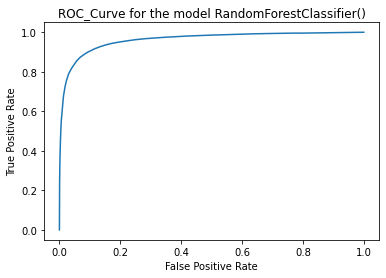

ROC AUC SCORE is- 0.9032259520074261


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model RandomForestClassifier() is 0.8878570143541713




In [200]:
model(rfc,x,y)

For model AdaBoostClassifier()
Training_Accuracy_Score= 0.7722538153048325
Testing_Accuracy_Score= 0.7713464080792662

 Classification Report-
               precision    recall  f1-score   support

           0       0.76      0.79      0.78     36646
           1       0.79      0.75      0.77     36727

    accuracy                           0.77     73373
   macro avg       0.77      0.77      0.77     73373
weighted avg       0.77      0.77      0.77     73373


 Confusion Metrix-
 [[29126  7520]
 [ 9257 27470]]


AUC_ROC CURVE


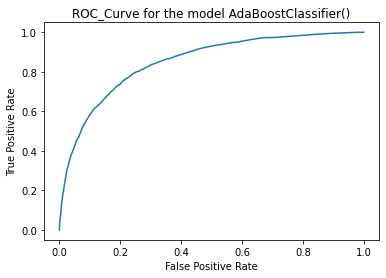

ROC AUC SCORE is- 0.7713722638352017


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model AdaBoostClassifier() is 0.7680408436959947




In [201]:
model(ad,x,y)

For model GradientBoostingClassifier()
Training_Accuracy_Score= 0.793072312761296
Testing_Accuracy_Score= 0.790944897986998

 Classification Report-
               precision    recall  f1-score   support

           0       0.79      0.80      0.79     36646
           1       0.80      0.78      0.79     36727

    accuracy                           0.79     73373
   macro avg       0.79      0.79      0.79     73373
weighted avg       0.79      0.79      0.79     73373


 Confusion Metrix-
 [[29326  7320]
 [ 8019 28708]]


AUC_ROC CURVE


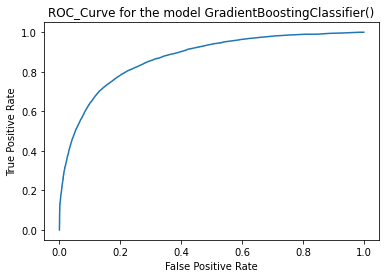

ROC AUC SCORE is- 0.7909551601696023


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GradientBoostingClassifier() is 0.7918454350682274




In [202]:
model(grd,x,y)

### Hyper Parameter Tuning
##### To make the model more accurate by providing their best parameters

In [203]:
from sklearn.model_selection import GridSearchCV

In [204]:
#defining all the parameters of the respective models
Parameter_neighbor={'weights':['uniform', 'distance'],'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute']}
Parameter_dtc={'criterion':["gini", "entropy", "log_loss"],'splitter':["best", "random"],'max_features':["auto", "sqrt", "log2"]}

In [205]:
#Now I'm defining a function so that i can individuallay let the model perfom and give the best parameter out of it.
def HPT(machine,dictionary):
    gd=GridSearchCV(machine,dictionary)
    gd.fit(x,y)
    print(f'The best Parameters of the model {machine} is {gd.best_params_}')

In [206]:
HPT(neighbor,Parameter_neighbor)

The best Parameters of the model KNeighborsClassifier() is {'algorithm': 'ball_tree', 'weights': 'distance'}


In [207]:
HPT(dtc,Parameter_dtc)

The best Parameters of the model DecisionTreeClassifier() is {'criterion': 'entropy', 'max_features': 'log2', 'splitter': 'best'}


##### It's taking lots of time (more than 48 hours) while finding out the best parameters for the Random forest classifier, Ada Boost and Gradient Boosting Classifier that's why i'm selecting predefined parameters for these three classifiers

In [209]:
#Redefining the models after getting the parameters
lr=LogisticRegression()
gb=GaussianNB()
neighbor=KNeighborsClassifier(algorithm='ball_tree',weights='distance')
dtc=DecisionTreeClassifier(criterion='entropy',max_features='log2',splitter='best')
rfc=RandomForestClassifier(class_weight= 'balanced',criterion='log_loss',max_features='log2')
ad=AdaBoostClassifier(algorithm= 'SAMME.R')
grd=GradientBoostingClassifier(criterion='squared_error',loss= 'log_loss',max_features= 'sqrt')

For model LogisticRegression()
Training_Accuracy_Score= 0.7277001863783651
Testing_Accuracy_Score= 0.7290692761642567

 Classification Report-
               precision    recall  f1-score   support

           0       0.69      0.82      0.75     36646
           1       0.78      0.63      0.70     36727

    accuracy                           0.73     73373
   macro avg       0.74      0.73      0.73     73373
weighted avg       0.74      0.73      0.73     73373


 Confusion Metrix-
 [[30191  6455]
 [13424 23303]]


AUC_ROC CURVE


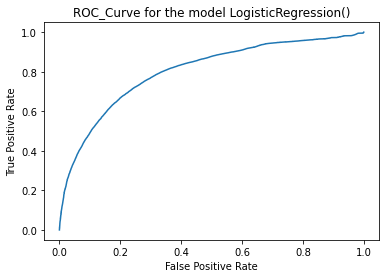

ROC AUC SCORE is- 0.7291737996075633


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model LogisticRegression() is 0.7278540704679144




In [210]:
model(lr,x,y)

For model GaussianNB()
Training_Accuracy_Score= 0.7140506117776134
Testing_Accuracy_Score= 0.7130415820533439

 Classification Report-
               precision    recall  f1-score   support

           0       0.66      0.87      0.75     36646
           1       0.81      0.55      0.66     36727

    accuracy                           0.71     73373
   macro avg       0.74      0.71      0.71     73373
weighted avg       0.74      0.71      0.71     73373


 Confusion Metrix-
 [[32035  4611]
 [16444 20283]]


AUC_ROC CURVE


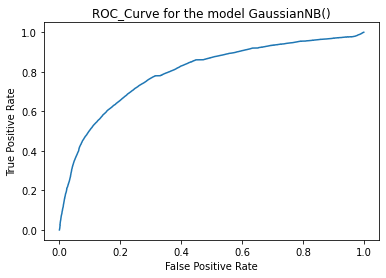

ROC AUC SCORE is- 0.713219268349086


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GaussianNB() is 0.7132872851371905




In [211]:
model(gb,x,y)

For model KNeighborsClassifier(algorithm='ball_tree', weights='distance')
Training_Accuracy_Score= 0.9991515866012014
Testing_Accuracy_Score= 0.8899867798781568

 Classification Report-
               precision    recall  f1-score   support

           0       0.84      0.97      0.90     36646
           1       0.96      0.81      0.88     36727

    accuracy                           0.89     73373
   macro avg       0.90      0.89      0.89     73373
weighted avg       0.90      0.89      0.89     73373


 Confusion Metrix-
 [[35543  1103]
 [ 6969 29758]]


AUC_ROC CURVE


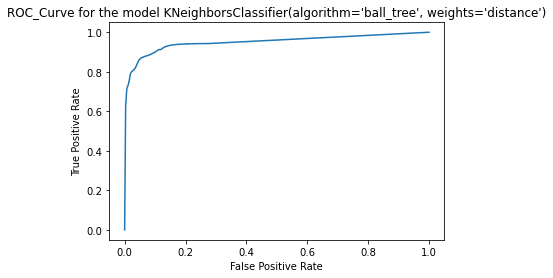

ROC AUC SCORE is- 0.8900749040022465


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model KNeighborsClassifier(algorithm='ball_tree', weights='distance') is 0.8741706690799265




In [212]:
model(neighbor,x,y)

For model DecisionTreeClassifier(criterion='entropy', max_features='log2')
Training_Accuracy_Score= 0.9989675933339921
Testing_Accuracy_Score= 0.8541425319940578

 Classification Report-
               precision    recall  f1-score   support

           0       0.84      0.87      0.86     36646
           1       0.87      0.83      0.85     36727

    accuracy                           0.85     73373
   macro avg       0.85      0.85      0.85     73373
weighted avg       0.85      0.85      0.85     73373


 Confusion Metrix-
 [[32026  4620]
 [ 6082 30645]]


AUC_ROC CURVE


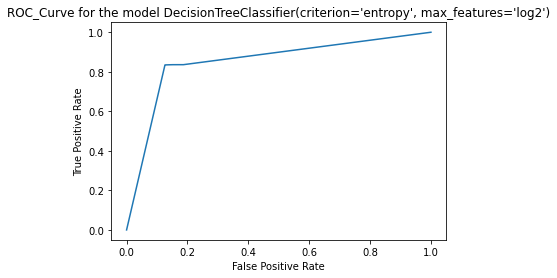

ROC AUC SCORE is- 0.8541643510807191


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model DecisionTreeClassifier(criterion='entropy', max_features='log2') is 0.8354340324154587




In [213]:
model(dtc,x,y)

For model RandomForestClassifier(class_weight='balanced', criterion='log_loss',
                       max_features='log2')
Training_Accuracy_Score= 0.9989675933339921
Testing_Accuracy_Score= 0.9028798059231598

 Classification Report-
               precision    recall  f1-score   support

           0       0.89      0.92      0.90     36646
           1       0.92      0.88      0.90     36727

    accuracy                           0.90     73373
   macro avg       0.90      0.90      0.90     73373
weighted avg       0.90      0.90      0.90     73373


 Confusion Metrix-
 [[33772  2874]
 [ 4252 32475]]


AUC_ROC CURVE


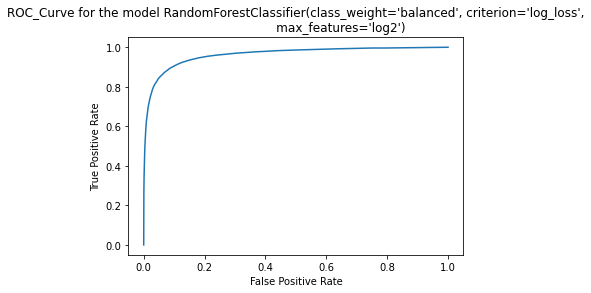

ROC AUC SCORE is- 0.9029004205655634


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model RandomForestClassifier(class_weight='balanced', criterion='log_loss',
                       max_features='log2') is 0.8877343524267981




In [214]:
model(rfc,x,y)

For model AdaBoostClassifier()
Training_Accuracy_Score= 0.7722538153048325
Testing_Accuracy_Score= 0.7713464080792662

 Classification Report-
               precision    recall  f1-score   support

           0       0.76      0.79      0.78     36646
           1       0.79      0.75      0.77     36727

    accuracy                           0.77     73373
   macro avg       0.77      0.77      0.77     73373
weighted avg       0.77      0.77      0.77     73373


 Confusion Metrix-
 [[29126  7520]
 [ 9257 27470]]


AUC_ROC CURVE


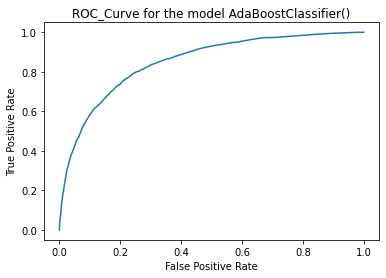

ROC AUC SCORE is- 0.7713722638352017


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model AdaBoostClassifier() is 0.7680408436959947




In [215]:
model(ad,x,y)

For model GradientBoostingClassifier(criterion='squared_error', max_features='sqrt')
Training_Accuracy_Score= 0.7916548831472389
Testing_Accuracy_Score= 0.7897591757185886

 Classification Report-
               precision    recall  f1-score   support

           0       0.79      0.80      0.79     36646
           1       0.79      0.78      0.79     36727

    accuracy                           0.79     73373
   macro avg       0.79      0.79      0.79     73373
weighted avg       0.79      0.79      0.79     73373


 Confusion Metrix-
 [[29209  7437]
 [ 7989 28738]]


AUC_ROC CURVE


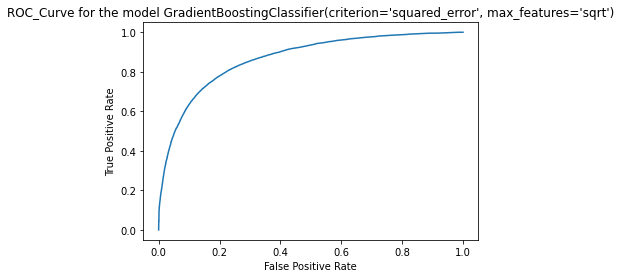

ROC AUC SCORE is- 0.7897672247352077


Finding out the best K-Fold Value

	
At the K-Fold 2 the CV score of model GradientBoostingClassifier(criterion='squared_error', max_features='sqrt') is 0.7906896871303106




In [216]:
model(grd,x,y)

In [224]:
Tabuler_form=pd.DataFrame(data={'Models':['LogisticRegression','GaussianNB','KNeighborsClassifier','DecisionTreeClassifier','RandomForestClassifier','AdaBoostClassifier','GradientBoostingClassifier'],'Traning_Accuracy_Score_%':[73,71,100,100,100,77,79],'Testing_Accuracy_Score_%':[73,71,89,85,90,77,79],'CV_SCORE_%':[73,71,86,84,89,77,79],'ROC_AUC_SCORE':[0.73,0.71,0.89,0.85,0.90,0.77,0.79]})
Tabuler_form

,Models,Traning_Accuracy_Score_%,Testing_Accuracy_Score_%,CV_SCORE_%,ROC_AUC_SCORE
0,LogisticRegression,73,73,73,0.73
1,GaussianNB,71,71,71,0.71
2,KNeighborsClassifier,100,89,86,0.89
3,DecisionTreeClassifier,100,85,84,0.85
4,RandomForestClassifier,100,90,89,0.90
5,AdaBoostClassifier,77,77,77,0.77
6,GradientBoostingClassifier,79,79,79,0.79


##### As we can see in the above DataFrame; RandomForestClassifier model seems perfect as compare to other models as the training accuracy is 100% while testing accuracy and CV score is 90% which is excellent accuracy.Also the CV score and testing accuracy are same as 90% too and it's also indicates that our model is performing excellent by each method either random_state or K-Fold method.The F1-score is 90% too it means that error are on lower side and ROC_AUC_SCORE is 0.90,which is greater than the threshold value of 0.6, which indicates that the machine probability is good while predicting 1 as 1 and 0 as 0.Also the Precision and Recalls are as- 92% and 88% resepectively and this indicates that 92 times system is getting positive predictions and 88% of the times model's actual and predicted values are true positive as 1 (i.e. customer are paying the loan on time).

### Saving the Best Model

In [225]:
import joblib
file='Micro_Credit_Defaulter.obj'
joblib.dump(rfc,file)

['Micro_Credit_Defaulter.obj']

### Loading the Modle

In [226]:
a=joblib.load('Micro_Credit_Defaulter.obj')
a

RandomForestClassifier(class_weight='balanced', criterion='log_loss',
                       max_features='log2')

In [227]:
pred=a.predict(x_test)
pred

array([0, 0, 0, ..., 1, 1, 0], dtype=int64)

In [228]:
accuracy=accuracy_score(pred,y_test)
accuracy

0.9028798059231598

### Plotting ROC_AUC_CURVE


The ROC AUC Score is= 0.9029004205655634


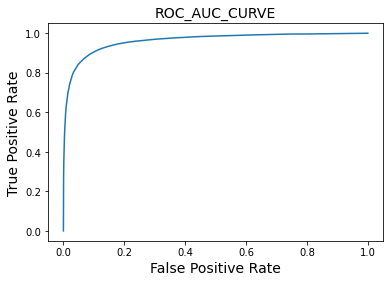

In [229]:
prob=a.predict_proba(x_test)[:,1]
FPR,TPR,THRESHOLD=roc_curve(y_test,prob)
plt.plot(FPR,TPR)
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)
plt.title('ROC_AUC_CURVE',fontsize=14)
print(f'\nThe ROC AUC Score is= {roc_auc_score(y_test,pred)}')

In [230]:
conclusion=pd.DataFrame(data=[pred,y_test],index=['Predicted label','Original label'])
conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

##### When I deployed our Random Forest Classifier Model to the y_test data what i found is that the testing accuracy of the model went to almost 91% which is excellent accuracy for predicting any target variable correctly.Also the ROC AUC Score is 0.90 which is greater than 0.6 of threshold value and it indicates that out of 100 times,96 times model is predicting the right classes i.e. 1 as 1 and 0 as 0 and this is still a great accuracy. As we can see in the conclusion portion we have got almost same value in predicted Label as compare to original Label. So we can say that this model has great accuracy while predicting the status of defaulter customers.